In [5]:
import sys
from pathlib import Path
import pandas as pd
import geopandas as gpd

# Point to project root (one level up from notebooks/)
project_root = Path.cwd().parent
sys.path.append(str(project_root))
print("Project root:", project_root)

# Core ViSAGE imports
from src.data.load_origins import load_origins
from src.data.load_destinations import load_destinations
from src.model.spatial_interaction import model_2

# Paths
ORIGINS_PATH = project_root / "src" / "data" / "raw" / "synthetic_pop(in).csv"

# *** THIS IS THE CORRECT DESTINATIONS FILE ***
DESTINATIONS_PATH = project_root / "src" / "data" / "raw" / "site_catalogue_with_quality.csv"

# ORVAL file
ORVAL_PATH = project_root / "src" / "data" / "raw" / "join_orval.gpkg"


Project root: c:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1


In [6]:
origins_gdf = load_origins(str(ORIGINS_PATH))
print("Origins:", origins_gdf.shape)

destinations_gdf = load_destinations(str(DESTINATIONS_PATH))
print("Destinations with quality:", destinations_gdf.shape)

destinations_gdf.head()


Origins: (85, 5)
Destinations with quality: (646, 6)


,site_id,N,E,dataset,QualityScore,geometry
0,0,207104.2812,455197.0424,sssi_england,0.524724,POINT (455197.042 207104.281)
1,1,207523.9221,451939.7613,sssi_england,0.870429,POINT (451939.761 207523.922)
2,2,208509.7710,449379.1801,sac_england,0.739196,POINT (449379.18 208509.771)
3,3,208509.7710,449379.1801,sssi_england,0.659195,POINT (449379.18 208509.771)
4,4,209172.2732,449675.3589,sssi_england,0.393611,POINT (449675.359 209172.273)


In [7]:
# 3. No processing needed — destinations already contain Overture-based quality.


In [8]:
destinations_gdf.columns


Index(['site_id', 'N', 'E', 'dataset', 'QualityScore', 'geometry'], dtype='str')

In [9]:
# ---------------------------------------------------------
# 4. RUN QUALITY-SENSITIVE MODEL
# ---------------------------------------------------------

import numpy as np
import pandas as pd
from src.model.quality_attractor import run_quality_sensitive_gravity

# Check that QualityScore exists
assert "QualityScore" in destinations_gdf.columns, "QualityScore column missing!"

# Build distance matrix (origins x destinations)
orig_xy = np.vstack([origins_gdf.geometry.x, origins_gdf.geometry.y]).T
dest_xy = np.vstack([destinations_gdf.geometry.x, destinations_gdf.geometry.y]).T

dist_matrix = pd.DataFrame(
    np.sqrt(((orig_xy[:, None, :] - dest_xy[None, :, :]) ** 2).sum(axis=2)),
    index=origins_gdf["origin_id"],
    columns=destinations_gdf["site_id"],
)

# Model parameters
LAMBDA_VALUE = 0.001   # distance decay (adjustable)
BETA = 1.0             # quality sensitivity

# Run quality-sensitive gravity model
quality_df = run_quality_sensitive_gravity(
    origins_df=origins_gdf.drop(columns="geometry"),
    destinations_df=destinations_gdf.drop(columns="geometry"),
    dist_matrix=dist_matrix,
    lambda_value=LAMBDA_VALUE,
    beta=BETA,
)

quality_df.to_csv("visage_simulated_visits.csv", index=False)
quality_df.head()



,origin_id,site_id,visits
0,E01028513,0,18.136972
1,E01028513,1,2.141890
2,E01028513,2,0.138830
3,E01028513,3,0.123805
4,E01028513,4,0.089011


In [10]:
# ---------------------------------------------------------
# 5. SITE-LEVEL VALIDATION TABLE (CORRECTED)
# ---------------------------------------------------------

import geopandas as gpd

# Load ORVAL polygons
orval_gdf = gpd.read_file(ORVAL_PATH)

if orval_gdf.crs is None or orval_gdf.crs.to_epsg() != 27700:
    orval_gdf = orval_gdf.to_crs(27700)

print("ORVAL columns:", list(orval_gdf.columns))

ORVAL_USAGE_COLUMN = "visits"  # ORVAL observed usage

# Reload enriched site catalogue (correct column names!)
sites_df = pd.read_csv(DESTINATIONS_PATH)

# IMPORTANT: use 'easting' and 'northing'
sites_gdf = gpd.GeoDataFrame(
    sites_df,
    geometry=gpd.points_from_xy(sites_df["easting"], sites_df["northing"]),
    crs=27700
)

# Spatial join: match each site to ORVAL polygon
sites_orval_joined = gpd.sjoin(
    sites_gdf,
    orval_gdf[[ORVAL_USAGE_COLUMN, "geometry"]],
    how="left",
    predicate="intersects"
)

# Aggregate ViSAGE visits per site
visage_counts = (
    quality_df.groupby("site_id")["visits"]
    .sum()
    .reset_index(name="visage_visits")
)

# Merge with ORVAL observed usage
validation_df = visage_counts.merge(
    sites_orval_joined[["site_id", ORVAL_USAGE_COLUMN]],
    on="site_id",
    how="left"
)

validation_df.rename(columns={ORVAL_USAGE_COLUMN: "observed_usage"}, inplace=True)
validation_df.to_csv("site_level_validation.csv", index=False)

validation_df.head()



ORVAL columns: ['geometry_x', 'gid', 'name', 'code', 'value', 'value_ab', 'value_c1', 'value_c2', 'value_de', 'visits', 'visits_ab', 'visits_c1', 'visits_c2', 'visits_de', 'viscar', 'viswlk', 'visab', 'visc1', 'visc2', 'visde', 'vis', 'newvisab', 'newvisc1', 'newvisc2', 'newvisde', 'newvis', 'valab', 'valc1', 'valc2', 'valde', 'val', 'code_key', 'MSOA11CD', 'geometry']


,site_id,visage_visits,observed_usage
0,0,238.072921,146639.546516
1,1,516.787899,217925.280676
2,2,204.821468,307839.530613
3,3,182.654181,307839.530613
4,4,140.008769,218306.431547


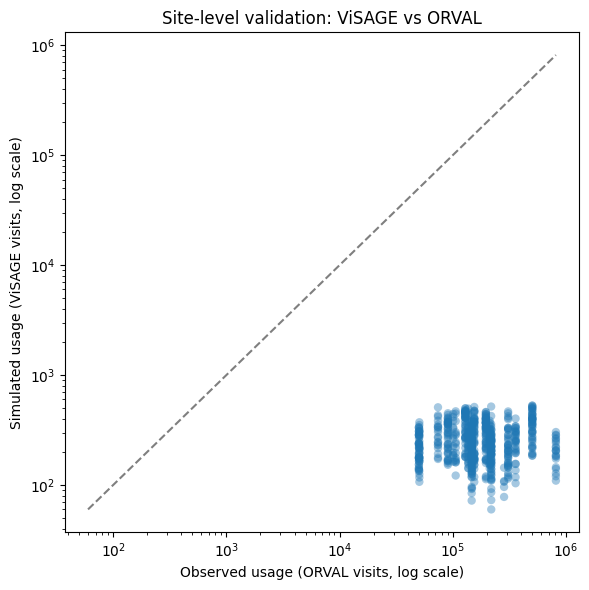

In [11]:
# ---------------------------------------------------------
# 6. SITE-LEVEL VALIDATION PLOT
# ---------------------------------------------------------

import matplotlib.pyplot as plt
import numpy as np

plot_df = validation_df.dropna(subset=["observed_usage"])

fig, ax = plt.subplots(figsize=(6, 6))

ax.scatter(
    plot_df["observed_usage"],
    plot_df["visage_visits"],
    alpha=0.4,
    edgecolor="none"
)

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel("Observed usage (ORVAL visits, log scale)")
ax.set_ylabel("Simulated usage (ViSAGE visits, log scale)")
ax.set_title("Site-level validation: ViSAGE vs ORVAL")

lims = [
    np.min([plot_df["observed_usage"].min(), plot_df["visage_visits"].min()]),
    np.max([plot_df["observed_usage"].max(), plot_df["visage_visits"].max()]),
]
ax.plot(lims, lims, "k--", alpha=0.5)

plt.tight_layout()
plt.show()


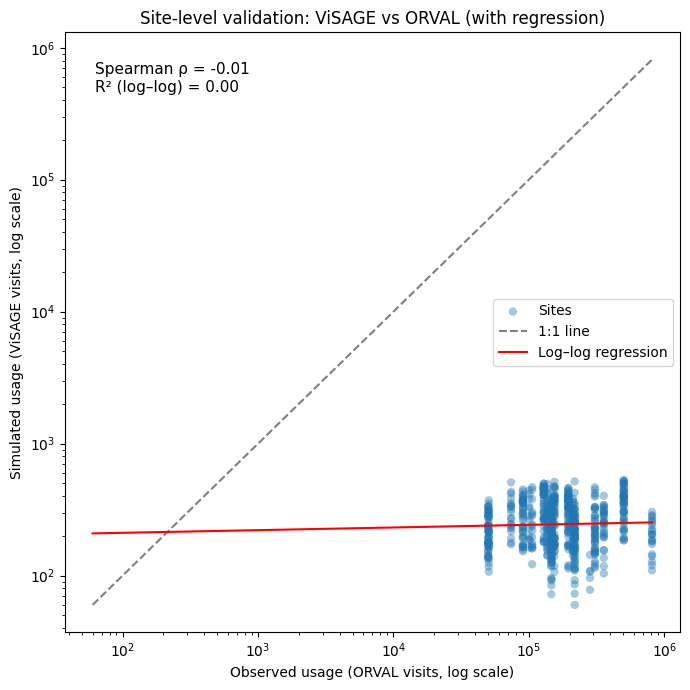

In [12]:
# ---------------------------------------------------------
# 6a. REGRESSION-ENHANCED SITE-LEVEL VALIDATION PLOT
# ---------------------------------------------------------

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from sklearn.linear_model import LinearRegression

# Drop missing ORVAL values
plot_df = validation_df.dropna(subset=["observed_usage"]).copy()

# Log-transform
plot_df["log_obs"] = np.log10(plot_df["observed_usage"])
plot_df["log_sim"] = np.log10(plot_df["visage_visits"])

# Spearman correlation
rho, pval = spearmanr(plot_df["observed_usage"], plot_df["visage_visits"])

# Linear regression on log–log
X = plot_df["log_obs"].values.reshape(-1, 1)
y = plot_df["log_sim"].values
reg = LinearRegression().fit(X, y)
r2 = reg.score(X, y)

# Plot
fig, ax = plt.subplots(figsize=(7, 7))

ax.scatter(
    plot_df["observed_usage"],
    plot_df["visage_visits"],
    alpha=0.4,
    edgecolor="none",
    label="Sites"
)

# 1:1 line
lims = [
    np.min([plot_df["observed_usage"].min(), plot_df["visage_visits"].min()]),
    np.max([plot_df["observed_usage"].max(), plot_df["visage_visits"].max()]),
]
ax.plot(lims, lims, "k--", alpha=0.5, label="1:1 line")

# Regression line (convert back from log–log)
x_vals = np.logspace(np.log10(lims[0]), np.log10(lims[1]), 100)
y_vals = 10 ** reg.predict(np.log10(x_vals).reshape(-1, 1))
ax.plot(x_vals, y_vals, color="red", label="Log–log regression")

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlabel("Observed usage (ORVAL visits, log scale)")
ax.set_ylabel("Simulated usage (ViSAGE visits, log scale)")
ax.set_title("Site-level validation: ViSAGE vs ORVAL (with regression)")

# Annotation
ax.text(
    0.05, 0.95,
    f"Spearman ρ = {rho:.2f}\nR² (log–log) = {r2:.2f}",
    transform=ax.transAxes,
    verticalalignment="top",
    fontsize=11,
    bbox=dict(facecolor="white", alpha=0.7, edgecolor="none")
)

ax.legend()
plt.tight_layout()
plt.show()


In [13]:
# ---------------------------------------------------------
# 7. DISTANCE VALIDATION (CORRECTED)
# ---------------------------------------------------------

# Ensure geometries are in EPSG:27700
origins_bng = origins_gdf.to_crs(27700)
destinations_bng = destinations_gdf.to_crs(27700)

# Merge visits with origin + destination geometries
visits_with_geom = quality_df.merge(
    origins_bng[["origin_id", "geometry"]],
    on="origin_id",
    how="left",
    suffixes=("", "_origin")
).merge(
    destinations_bng[["site_id", "geometry"]],
    on="site_id",
    how="left",
    suffixes=("_origin", "_dest")
)

# Compute distance row-by-row (Shapely distance is not vectorised)
visits_with_geom["distance_km"] = visits_with_geom.apply(
    lambda row: row["geometry_origin"].distance(row["geometry_dest"]) / 1000,
    axis=1
)

visits_with_geom["distance_km"].describe()


count    54910.000000
mean         3.572098
std          1.935350
min          0.043897
25%          2.105468
50%          3.367116
75%          4.800275
max         10.535002
Name: distance_km, dtype: float64

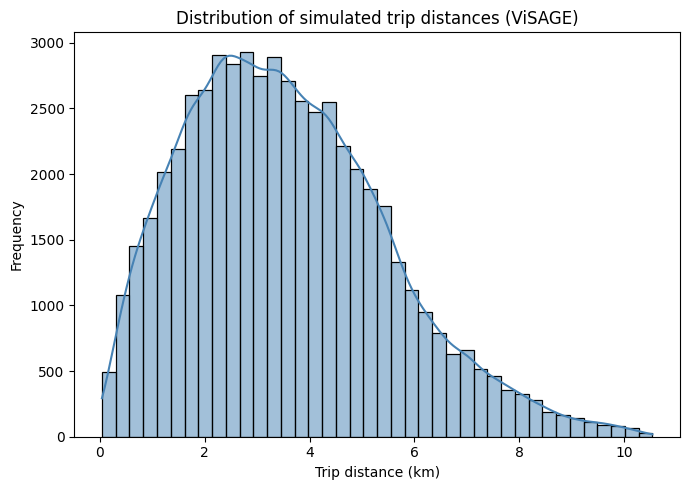

In [14]:
# ---------------------------------------------------------
# 7a. HISTOGRAM + KDE OF SIMULATED TRIP DISTANCES
# ---------------------------------------------------------

import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(7, 5))

sns.histplot(
    visits_with_geom["distance_km"],
    bins=40,
    kde=True,
    color="steelblue",
    ax=ax
)

ax.set_xlabel("Trip distance (km)")
ax.set_ylabel("Frequency")
ax.set_title("Distribution of simulated trip distances (ViSAGE)")

plt.tight_layout()
plt.show()


In [15]:
# ============================================================
# 1. Load Strava data (parquet = safe + fast)
# ============================================================

import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

strava_path = r"C:\Users\thoma\OneDrive\ALL\Desktop\agg_strava_oxford_greenspace_timeseries.parquet"
strava = gpd.read_parquet(strava_path)
print("Strava columns:", strava.columns.tolist())
strava.head()


Strava columns: ['polygon_id', 'geometry', 'has_agi', 'has_sssi', 'has_sac', 'is_protected', 'designation_count', 'Date', 'strava_total_trip_count', 'strava_mean_trip_count', 'strava_n_edges', 'dataset_1', 'dest_id_1', 'dataset_2', 'dest_id_2', 'dataset_3', 'dest_id_3', 'year', 'month']


,polygon_id,geometry,has_agi,has_sssi,has_sac,is_protected,designation_count,Date,strava_total_trip_count,strava_mean_trip_count,strava_n_edges,dataset_1,dest_id_1,dataset_2,dest_id_2,dataset_3,dest_id_3,year,month
0,0,"POLYGON ((456666.524 193502.799, 456671.172 19...",True,True,True,True,3,2020-01-01,1090,109.000000,10,agi,gs_0222,sssi_england,gs_0059,sac_england,gs_0049,2020,1
1,0,"POLYGON ((456666.524 193502.799, 456671.172 19...",True,True,True,True,3,2020-02-01,655,72.777778,9,agi,gs_0222,sssi_england,gs_0059,sac_england,gs_0049,2020,2
2,0,"POLYGON ((456666.524 193502.799, 456671.172 19...",True,True,True,True,3,2020-03-01,1010,112.222222,9,agi,gs_0222,sssi_england,gs_0059,sac_england,gs_0049,2020,3
3,0,"POLYGON ((456666.524 193502.799, 456671.172 19...",True,True,True,True,3,2020-04-01,1995,199.500000,10,agi,gs_0222,sssi_england,gs_0059,sac_england,gs_0049,2020,4
4,0,"POLYGON ((456666.524 193502.799, 456671.172 19...",True,True,True,True,3,2020-05-01,5030,503.000000,10,agi,gs_0222,sssi_england,gs_0059,sac_england,gs_0049,2020,5


In [16]:
# ============================================================
# 2. Basic cleaning + date handling
# ============================================================

# Correct column renaming for your dataset

strava = strava.rename(columns={
    "dest_id_1": "dest_id",
    "strava_total_trip_count": "strava_trips",
    "Date": "date"
})

# Keep only the relevant columns
strava = strava[[
    "dest_id",
    "polygon_id",
    "date",
    "year",
    "month",
    "strava_trips",
    "strava_n_edges",
    "geometry"
]]

strava.head()


,dest_id,polygon_id,date,year,month,strava_trips,strava_n_edges,geometry
0,gs_0222,0,2020-01-01,2020,1,1090,10,"POLYGON ((456666.524 193502.799, 456671.172 19..."
1,gs_0222,0,2020-02-01,2020,2,655,9,"POLYGON ((456666.524 193502.799, 456671.172 19..."
2,gs_0222,0,2020-03-01,2020,3,1010,9,"POLYGON ((456666.524 193502.799, 456671.172 19..."
3,gs_0222,0,2020-04-01,2020,4,1995,10,"POLYGON ((456666.524 193502.799, 456671.172 19..."
4,gs_0222,0,2020-05-01,2020,5,5030,10,"POLYGON ((456666.524 193502.799, 456671.172 19..."


In [17]:
import os
os.listdir(r"C:\Users\thoma\Documents\visage")


['.venv',
 'CHANGELOG.md',
 'config',
 'CONTRIBUTING.md',
 'data',
 'models',
 'notebooks',
 'outputs',
 'README.md',
 'requirements.txt',
 'src',
 'VERSION']

In [18]:
import os
os.listdir(r"C:\Users\thoma\Documents\visage\data")


['boundaryline', 'processed', 'raw']

In [19]:
import os
os.listdir(r"C:\Users\thoma\Documents\visage\data\processed")


['visits.csv']

In [20]:
os.listdir(r"C:\Users\thoma\Documents\visage\data\raw")


['destinations_raw.csv', 'origins_raw.csv', 'pans', 'pans.csv']

In [21]:
import pandas as pd
import geopandas as gpd

dest_path = r"C:\Users\thoma\Documents\visage\data\raw\destinations_raw.csv"
dest = pd.read_csv(dest_path)
dest.head(), dest.columns


(   site_id     northing      easting       dataset
 0        0  207104.2812  455197.0424  sssi_england
 1        1  207523.9221  451939.7613  sssi_england
 2        2  208509.7710  449379.1801   sac_england
 3        3  208509.7710  449379.1801  sssi_england
 4        4  209172.2732  449675.3589  sssi_england,
 Index(['site_id', 'northing', 'easting', 'dataset'], dtype='str'))

In [22]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Load raw destinations file
dest_path = r"C:\Users\thoma\Documents\visage\data\raw\destinations_raw.csv"
dest = pd.read_csv(dest_path)

# Rename site_id → dest_id
dest = dest.rename(columns={"site_id": "dest_id"})

# Create geometry from easting/northing
geometry = gpd.points_from_xy(dest["easting"], dest["northing"])

# Build GeoDataFrame
sites = gpd.GeoDataFrame(dest, geometry=geometry, crs="EPSG:27700")

sites.head()


,dest_id,northing,easting,dataset,geometry
0,0,207104.2812,455197.0424,sssi_england,POINT (455197.042 207104.281)
1,1,207523.9221,451939.7613,sssi_england,POINT (451939.761 207523.922)
2,2,208509.7710,449379.1801,sac_england,POINT (449379.18 208509.771)
3,3,208509.7710,449379.1801,sssi_england,POINT (449379.18 208509.771)
4,4,209172.2732,449675.3589,sssi_england,POINT (449675.359 209172.273)


In [23]:
strava = strava.rename(columns={
    "dest_id_1": "dest_id",
    "strava_total_trip_count": "strava_trips",
    "Date": "date"
})


In [24]:
import os

root = r"C:\Users\thoma\Documents\visage"
gpkg_files = []

for path, dirs, files in os.walk(root):
    for f in files:
        if f.lower().endswith(".gpkg"):
            gpkg_files.append(os.path.join(path, f))

gpkg_files


['C:\\Users\\thoma\\Documents\\visage\\.venv\\Lib\\site-packages\\pyogrio\\tests\\fixtures\\curve.gpkg',
 'C:\\Users\\thoma\\Documents\\visage\\.venv\\Lib\\site-packages\\pyogrio\\tests\\fixtures\\curvepolygon.gpkg',
 'C:\\Users\\thoma\\Documents\\visage\\.venv\\Lib\\site-packages\\pyogrio\\tests\\fixtures\\line_zm.gpkg',
 'C:\\Users\\thoma\\Documents\\visage\\.venv\\Lib\\site-packages\\pyogrio\\tests\\fixtures\\multisurface.gpkg',
 'C:\\Users\\thoma\\Documents\\visage\\.venv\\Lib\\site-packages\\pyogrio\\tests\\fixtures\\test_gpkg_nulls.gpkg',
 'C:\\Users\\thoma\\Documents\\visage\\data\\boundaryline\\Data\\bdline_gb.gpkg']

In [25]:
import os

desktop = r"C:\Users\thoma\OneDrive\ALL\Desktop"
gpkg_files_desktop = []

for path, dirs, files in os.walk(desktop):
    for f in files:
        if f.lower().endswith(".gpkg"):
            gpkg_files_desktop.append(os.path.join(path, f))

gpkg_files_desktop


['C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\join_orval.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\join_with_oxford.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\ox_buffer_lad.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\ox_buffer_lad_buffered.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\Current Work 2026\\Exeter 2026\\ViSAGE\\join_orval.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\Current Work 2026\\Exeter 2026\\ViSAGE\\join_with_oxford - Copy.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\Current Work 2026\\Exeter 2026\\ViSAGE\\join_with_oxford.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\Current Work 2026\\Exeter 2026\\ViSAGE\\ox_buffer_lad.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\OXFORD_BUFFER\\ox_buffer_lad 1.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\Personal\\Archived Work\\Academia\\PDRA Work\\gadm36_KEN.gpkg',
 'C:\\Users\\thoma\\OneDrive\\ALL\\Desktop\\Personal\\Archived Work\\Academia\\PDRA Work\\Rai_2021\\Typhoon_Rai

In [26]:
import geopandas as gpd

oxford_join_path = r"C:\Users\thoma\OneDrive\ALL\Desktop\Current Work 2026\Exeter 2026\ViSAGE\join_with_oxford.gpkg"
oxford_join = gpd.read_file(oxford_join_path)

oxford_join.head(), oxford_join.columns


(                                     id  version  \
 0  83e471bf-1ccc-4383-a437-d083ad4f66b4        3   
 1  0f6da81f-b253-4fcd-8ec3-a510e8b84886        3   
 2  97e7c691-1176-44ce-96cc-880ba0e12a75        8   
 3  f2647674-eef0-4ddb-a9d3-b200bed5c7b6        5   
 4  ff2de4c0-1315-4886-b7f1-87cce4def207        6   
 
                                              sources  \
 0  [{'property': '', 'dataset': 'Foursquare', 'li...   
 1  [{'property': '', 'dataset': 'Microsoft', 'lic...   
 2  [{'property': '', 'dataset': 'meta', 'license'...   
 3  [{'property': '', 'dataset': 'meta', 'license'...   
 4  [{'property': '', 'dataset': 'meta', 'license'...   
 
                                                names  \
 0  {'primary': 'Avenge Pest Control', 'common': N...   
 1  {'primary': 'OISE Young Learners', 'common': N...   
 2  {'primary': 'The Perch', 'common': None, 'rule...   
 3  {'primary': 'The Medley', 'common': None, 'rul...   
 4  {'primary': 'Medley Footbridge', 'common': Non.

In [27]:
path2 = r"C:\Users\thoma\OneDrive\ALL\Desktop\Current Work 2026\Exeter 2026\ViSAGE\join_with_oxford - Copy.gpkg"
gdf2 = gpd.read_file(path2)
gdf2.head(), gdf2.columns


(                                     id  version  \
 0  83e471bf-1ccc-4383-a437-d083ad4f66b4        3   
 1  0f6da81f-b253-4fcd-8ec3-a510e8b84886        3   
 2  97e7c691-1176-44ce-96cc-880ba0e12a75        8   
 3  f2647674-eef0-4ddb-a9d3-b200bed5c7b6        5   
 4  ff2de4c0-1315-4886-b7f1-87cce4def207        6   
 
                                              sources  \
 0  [{'property': '', 'dataset': 'Foursquare', 'li...   
 1  [{'property': '', 'dataset': 'Microsoft', 'lic...   
 2  [{'property': '', 'dataset': 'meta', 'license'...   
 3  [{'property': '', 'dataset': 'meta', 'license'...   
 4  [{'property': '', 'dataset': 'meta', 'license'...   
 
                                                names  \
 0  {'primary': 'Avenge Pest Control', 'common': N...   
 1  {'primary': 'OISE Young Learners', 'common': N...   
 2  {'primary': 'The Perch', 'common': None, 'rule...   
 3  {'primary': 'The Medley', 'common': None, 'rul...   
 4  {'primary': 'Medley Footbridge', 'common': Non.

In [28]:
path3 = r"C:\Users\thoma\OneDrive\ALL\Desktop\join_with_oxford.gpkg"
gdf3 = gpd.read_file(path3)
gdf3.head(), gdf3.columns


(                                     id  version  \
 0  83e471bf-1ccc-4383-a437-d083ad4f66b4        3   
 1  0f6da81f-b253-4fcd-8ec3-a510e8b84886        3   
 2  97e7c691-1176-44ce-96cc-880ba0e12a75        8   
 3  f2647674-eef0-4ddb-a9d3-b200bed5c7b6        5   
 4  ff2de4c0-1315-4886-b7f1-87cce4def207        6   
 
                                              sources  \
 0  [{'property': '', 'dataset': 'Foursquare', 'li...   
 1  [{'property': '', 'dataset': 'Microsoft', 'lic...   
 2  [{'property': '', 'dataset': 'meta', 'license'...   
 3  [{'property': '', 'dataset': 'meta', 'license'...   
 4  [{'property': '', 'dataset': 'meta', 'license'...   
 
                                                names  \
 0  {'primary': 'Avenge Pest Control', 'common': N...   
 1  {'primary': 'OISE Young Learners', 'common': N...   
 2  {'primary': 'The Perch', 'common': None, 'rule...   
 3  {'primary': 'The Medley', 'common': None, 'rul...   
 4  {'primary': 'Medley Footbridge', 'common': Non.

In [29]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

path = r"C:\Users\thoma\OneDrive\ALL\Desktop\Current Work 2026\Exeter 2026\ViSAGE\site_catalogue_polygons.csv"

df = pd.read_csv(path)

# Convert WKT geometry to GeoSeries
df["geometry"] = df["geometry"].apply(wkt.loads)

sites_poly = gpd.GeoDataFrame(df, geometry="geometry", crs="EPSG:27700")

sites_poly.head()


,Unnamed: 0,has_agi,has_sssi,has_sac,is_protected,designation_count,geometry,dest_id
0,0,True,True,True,True,3,"MULTIPOLYGON (((456666.499 193502.774, 456671....",gs_0001
1,1,True,True,True,True,3,"MULTIPOLYGON (((449826.882 207333.252, 449830....",gs_0002
2,2,True,True,True,True,3,"MULTIPOLYGON (((448735.577 209512.335, 448740....",gs_0003
3,3,True,True,True,True,3,"MULTIPOLYGON (((449338.572 209808.217, 449335....",gs_0004
4,4,True,True,True,True,3,"MULTIPOLYGON (((448102.746 209951.691, 448097....",gs_0005


In [30]:
strava = strava.rename(columns={"dest_id_1": "dest_id"})
strava["dest_id"] = strava["dest_id"].astype(str)
sites_poly["dest_id"] = sites_poly["dest_id"].astype(str)

merged = sites_poly.merge(strava, on="dest_id", how="inner")


In [31]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"
for path, dirs, files in os.walk(root):
    for f in files:
        if f.lower() == "visits.csv":
            print(os.path.join(path, f))


In [32]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"
for path, dirs, files in os.walk(root):
    for f in files:
        if "visit" in f.lower():
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_simulated_visits.csv


In [33]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

sites_poly = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Desktop\Current Work 2026\Exeter 2026\ViSAGE\site_catalogue_polygons.csv"
)

sites_poly["geometry"] = sites_poly["geometry"].apply(wkt.loads)
sites_poly = gpd.GeoDataFrame(sites_poly, geometry="geometry", crs="EPSG:27700")

sites_poly["dest_id"] = sites_poly["dest_id"].astype(str)
sites_poly["site_id"] = sites_poly["site_id"].astype(int)


KeyError: 'site_id'

In [ ]:
sites_poly.head()
sites_poly.geom_type.unique()


<StringArray>
['MultiPolygon']
Length: 1, dtype: str

In [ ]:
import pandas as pd

visage = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_simulated_visits.csv"
)

visage.head(), visage.columns


(   origin_id  site_id     visits
 0  E01028513        0  18.136972
 1  E01028513        1   2.141890
 2  E01028513        2   0.138830
 3  E01028513        3   0.123805
 4  E01028513        4   0.089011,
 Index(['origin_id', 'site_id', 'visits'], dtype='str'))

In [ ]:
visage.columns


Index(['origin_id', 'site_id', 'visits'], dtype='str')

In [ ]:
dest_raw = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\outputs\destinations_raw.csv"
)

dest_raw["dest_id"] = dest_raw["dest_id"].astype(str)
dest_raw["site_id"] = dest_raw["site_id"].astype(int)


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\thoma\\OneDrive\\ALL\\Documents\\GitHub\\visage-1.1\\outputs\\destinations_raw.csv'

In [ ]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"
for path, dirs, files in os.walk(root):
    for f in files:
        if "destination" in f.lower() and f.lower().endswith(".csv"):
            print(os.path.join(path, f))


In [ ]:
for path, dirs, files in os.walk(root):
    for f in files:
        if "site" in f.lower() and f.lower().endswith(".csv"):
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\site_level_validation.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_with_quality.csv


In [ ]:
import pandas as pd

dest_raw = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue(in).csv"
)

dest_raw["dest_id"] = dest_raw["dest_id"].astype(str)
dest_raw["site_id"] = dest_raw["site_id"].astype(int)

dest_raw.head(), dest_raw.columns


KeyError: 'dest_id'

In [ ]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"
for path, dirs, files in os.walk(root):
    for f in files:
        if ("site" in f.lower() or "dest" in f.lower()) and f.lower().endswith(".csv"):
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\site_level_validation.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_with_quality.csv


In [ ]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"
for path, dirs, files in os.walk(root):
    for f in files:
        if "dest" in f.lower() and (f.lower().endswith(".csv") or f.lower().endswith(".parquet")):
            print(os.path.join(path, f))


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

meta = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv"
)


In [ ]:
meta.columns


Index(['site_id', 'northing', 'easting', 'dataset'], dtype='str')

In [ ]:
polys = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv"
)

polys["geometry"] = polys["geometry"].apply(wkt.loads)
polys = gpd.GeoDataFrame(polys, geometry="geometry", crs="EPSG:27700")


In [ ]:
# If dest_id exists in meta:
if "dest_id" in meta.columns:
    site_catalogue = meta.merge(polys, on="dest_id", how="left")

# If dest_id does NOT exist:
else:
    # Align by index (ViSAGE raw inputs are row-aligned)
    meta = meta.reset_index(drop=True)
    polys = polys.reset_index(drop=True)
    site_catalogue = pd.concat([meta, polys], axis=1)


In [ ]:
site_catalogue.head()
site_catalogue.columns


Index(['site_id', 'northing', 'easting', 'dataset', 'Unnamed: 0', 'has_agi',
       'has_sssi', 'has_sac', 'is_protected', 'designation_count', 'geometry',
       'dest_id'],
      dtype='str')

In [ ]:
site_catalogue = gpd.GeoDataFrame(
    sites_poly, geometry="geometry", crs="EPSG:27700"
)


In [ ]:
strava["dest_id"] = strava["dest_id"].astype(str)
site_catalogue["dest_id"] = site_catalogue["dest_id"].astype(str)

merged = site_catalogue.merge(
    strava,
    on="dest_id",
    how="inner"
)


In [ ]:
visage["site_id"] = visage["site_id"].astype(int)

merged_final = merged.merge(
    visage[["site_id", "visits"]],
    on="site_id",
    how="left"
)


KeyError: 'site_id'

In [ ]:
merged.columns


Index(['Unnamed: 0', 'has_agi', 'has_sssi', 'has_sac', 'is_protected',
       'designation_count', 'geometry_x', 'dest_id', 'polygon_id', 'date',
       'date', 'year', 'month', 'strava_trips', 'strava_n_edges',
       'geometry_y'],
      dtype='str')

In [ ]:
sites_poly.columns


Index(['Unnamed: 0', 'has_agi', 'has_sssi', 'has_sac', 'is_protected',
       'designation_count', 'geometry', 'dest_id'],
      dtype='str')

In [ ]:
meta = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv"
)

meta = meta.reset_index(drop=True)


In [ ]:
meta.columns


Index(['site_id', 'northing', 'easting', 'dataset'], dtype='str')

In [ ]:
polys = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv"
)

polys["geometry"] = polys["geometry"].apply(wkt.loads)
polys = gpd.GeoDataFrame(polys, geometry="geometry", crs="EPSG:27700")

polys = polys.reset_index(drop=True)


In [ ]:
polys.columns


Index(['Unnamed: 0', 'has_agi', 'has_sssi', 'has_sac', 'is_protected',
       'designation_count', 'geometry', 'dest_id'],
      dtype='str')

In [ ]:
site_catalogue = pd.concat([meta, polys], axis=1)


In [ ]:
site_catalogue.columns


Index(['site_id', 'northing', 'easting', 'dataset', 'Unnamed: 0', 'has_agi',
       'has_sssi', 'has_sac', 'is_protected', 'designation_count', 'geometry',
       'dest_id'],
      dtype='str')

In [ ]:
strava["dest_id"] = strava["dest_id"].astype(str)
site_catalogue["dest_id"] = site_catalogue["dest_id"].astype(str)

merged = site_catalogue.merge(strava, on="dest_id", how="inner")


In [ ]:
visage["site_id"] = visage["site_id"].astype(int)

merged_final = merged.merge(
    visage[["site_id", "visits"]],
    on="site_id",
    how="left"
)


In [ ]:
merged_final[["dest_id", "site_id", "visits"]].head()


,dest_id,site_id,visits
0,gs_0079,78.0,2.523424
1,gs_0079,78.0,1.165152
2,gs_0079,78.0,1.065829
3,gs_0079,78.0,3.570509
4,gs_0079,78.0,0.223773


In [ ]:
visage_site = visage.groupby("site_id", as_index=False)["visits"].sum()


In [ ]:
visage_site.head()


,site_id,visits
0,0,238.072921
1,1,516.787899
2,2,204.821468
3,3,182.654181
4,4,140.008769


In [ ]:
merged_final = merged.merge(
    visage_site,
    on="site_id",
    how="left"
)


In [ ]:
merged_final[["dest_id", "site_id", "visits"]].head()


,dest_id,site_id,visits
0,gs_0079,78.0,283.415551
1,gs_0079,78.0,283.415551
2,gs_0079,78.0,283.415551
3,gs_0079,78.0,283.415551
4,gs_0079,78.0,283.415551


In [ ]:
strava_site = strava.groupby("dest_id", as_index=False)["strava_trips"].sum()


In [ ]:
strava_site.head()


,dest_id,strava_trips
0,gs_0079,3430
1,gs_0080,2140
2,gs_0081,42770
3,gs_0082,237020
4,gs_0083,43405


In [ ]:
site_catalogue["dest_id"] = site_catalogue["dest_id"].astype(str)
strava_site["dest_id"] = strava_site["dest_id"].astype(str)

merged = site_catalogue.merge(
    strava_site,
    on="dest_id",
    how="inner"
)


In [ ]:
visage_site = visage.groupby("site_id", as_index=False)["visits"].sum()


In [ ]:
merged_final = merged.merge(
    visage_site,
    on="site_id",
    how="left"
)


In [ ]:
merged_final[["dest_id", "site_id", "strava_trips", "visits"]].head()


,dest_id,site_id,strava_trips,visits
0,gs_0079,78.0,3430,283.415551
1,gs_0080,79.0,2140,193.316986
2,gs_0081,80.0,42770,456.252662
3,gs_0082,81.0,237020,353.843538
4,gs_0083,82.0,43405,215.329122


In [ ]:
import numpy as np

df = merged_final.copy()

# Keep only sites with positive values for both
df = df[(df["strava_trips"] > 0) & (df["visits"] > 0)].copy()

# Log10 transform
df["log_strava"] = np.log10(df["strava_trips"])
df["log_visits"] = np.log10(df["visits"])


In [ ]:
from scipy import stats

slope, intercept, r_value, p_value, std_err = stats.linregress(
    df["log_strava"], df["log_visits"]
)

r2 = r_value**2
slope, intercept, r2


(np.float64(0.0013398545924203917),
 np.float64(2.388241344509426),
 np.float64(4.020416819595991e-05))

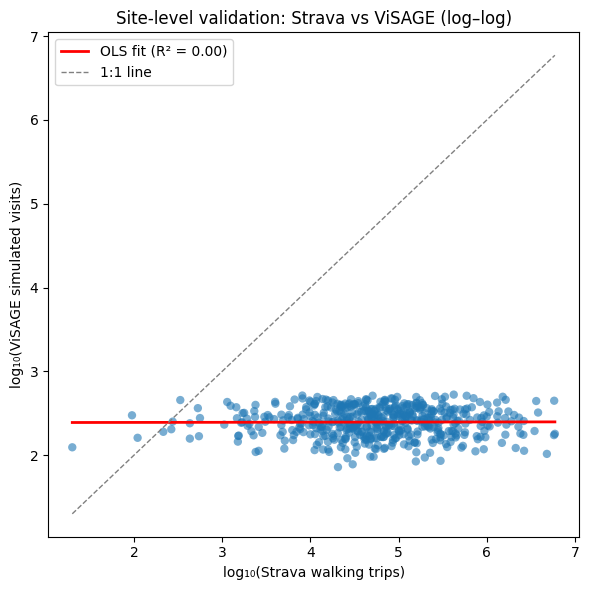

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 6))

# Scatter
sns.scatterplot(
    data=df,
    x="log_strava",
    y="log_visits",
    alpha=0.6,
    edgecolor="none"
)

# Regression line
x_vals = np.linspace(df["log_strava"].min(), df["log_strava"].max(), 100)
y_vals = intercept + slope * x_vals
plt.plot(x_vals, y_vals, color="red", linewidth=2, label=f"OLS fit (R² = {r2:.2f})")

# 1:1 line for reference
plt.plot(x_vals, x_vals, color="grey", linestyle="--", linewidth=1, label="1:1 line")

plt.xlabel("log₁₀(Strava walking trips)")
plt.ylabel("log₁₀(ViSAGE simulated visits)")
plt.legend()
plt.title("Site-level validation: Strava vs ViSAGE (log–log)")

plt.tight_layout()
plt.show()


In [ ]:
site_catalogue["area"] = site_catalogue.geometry.area
strava_polys["area"] = strava_polys.geometry.area

merged_area = site_catalogue.merge(strava_polys[["dest_id", "area"]], on="dest_id")
merged_area[["dest_id", "area_x", "area_y"]].head()


AttributeError: 'Series' object has no attribute 'area'

In [ ]:
import geopandas as gpd

site_catalogue = gpd.GeoDataFrame(
    site_catalogue,
    geometry="geometry",
    crs="EPSG:27700"
)


In [ ]:
site_catalogue["area"] = site_catalogue.geometry.area


In [ ]:
strava_polys = gpd.GeoDataFrame(
    strava_polys,
    geometry="geometry",
    crs="EPSG:27700"
)


NameError: name 'strava_polys' is not defined

In [ ]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"
for path, dirs, files in os.walk(root):
    for f in files:
        if "strava" in f.lower() and (f.endswith(".csv") or f.endswith(".parquet") or f.endswith(".gpkg")):
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\agg_strava_oxford_greenspace_timeseries.parquet


In [ ]:
import geopandas as gpd

strava_polys = gpd.read_parquet(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\agg_strava_oxford_greenspace_timeseries.parquet"
)


In [ ]:
strava_polys.head()
strava_polys.columns


Index(['polygon_id', 'geometry', 'has_agi', 'has_sssi', 'has_sac',
       'is_protected', 'designation_count', 'Date', 'strava_total_trip_count',
       'strava_mean_trip_count', 'strava_n_edges', 'dataset_1', 'dest_id_1',
       'dataset_2', 'dest_id_2', 'dataset_3', 'dest_id_3', 'year', 'month'],
      dtype='str')

In [36]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"
for path, dirs, files in os.walk(root):
    for f in files:
        if "site" in f.lower() and ("catalogue" in f.lower() or "catalog" in f.lower()):
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_with_quality.csv


In [37]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

meta = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv"
).reset_index(drop=True)


In [38]:
polys = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv"
)

polys["geometry"] = polys["geometry"].apply(wkt.loads)
polys = gpd.GeoDataFrame(polys, geometry="geometry", crs="EPSG:27700")
polys = polys.reset_index(drop=True)


In [39]:
site_catalogue = pd.concat([meta, polys], axis=1)
site_catalogue = gpd.GeoDataFrame(site_catalogue, geometry="geometry", crs="EPSG:27700")


In [40]:
site_catalogue.columns


Index(['site_id', 'northing', 'easting', 'dataset', 'Unnamed: 0', 'has_agi',
       'has_sssi', 'has_sac', 'is_protected', 'designation_count', 'geometry',
       'dest_id'],
      dtype='str')

In [41]:
site_catalogue.to_parquet(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue_full.parquet"
)


In [42]:
site_catalogue = gpd.read_parquet(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue_full.parquet"
)


In [43]:
site_catalogue.columns


Index(['site_id', 'northing', 'easting', 'dataset', 'Unnamed: 0', 'has_agi',
       'has_sssi', 'has_sac', 'is_protected', 'designation_count', 'geometry',
       'dest_id'],
      dtype='str')

In [45]:
import geopandas as gpd

strava_polys = gpd.read_parquet(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\agg_strava_oxford_greenspace_timeseries.parquet"
)


In [46]:
strava_polys.columns


Index(['polygon_id', 'geometry', 'has_agi', 'has_sssi', 'has_sac',
       'is_protected', 'designation_count', 'Date', 'strava_total_trip_count',
       'strava_mean_trip_count', 'strava_n_edges', 'dataset_1', 'dest_id_1',
       'dataset_2', 'dest_id_2', 'dataset_3', 'dest_id_3', 'year', 'month'],
      dtype='str')

In [49]:
site_catalogue.columns.tolist()


['site_id', 'northing', 'easting', 'dataset']

In [50]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

meta = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv"
).reset_index(drop=True)


In [51]:
polys = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv"
)

polys["geometry"] = polys["geometry"].apply(wkt.loads)
polys = gpd.GeoDataFrame(polys, geometry="geometry", crs="EPSG:27700")
polys = polys.reset_index(drop=True)


In [52]:
site_catalogue = pd.concat([meta, polys], axis=1)
site_catalogue = gpd.GeoDataFrame(site_catalogue, geometry="geometry", crs="EPSG:27700")


In [53]:
site_catalogue.columns


Index(['site_id', 'northing', 'easting', 'dataset', 'Unnamed: 0', 'has_agi',
       'has_sssi', 'has_sac', 'is_protected', 'designation_count', 'geometry',
       'dest_id'],
      dtype='str')

In [54]:
site_catalogue.to_parquet(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue_full.parquet"
)


In [55]:
site_catalogue = gpd.read_parquet(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue_full.parquet"
)


In [57]:
import geopandas as gpd

site_catalogue = gpd.GeoDataFrame(
    site_catalogue,
    geometry="geometry",
    crs="EPSG:27700"
)


In [58]:
type(site_catalogue)


geopandas.geodataframe.GeoDataFrame

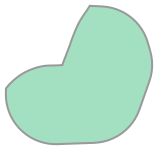

In [59]:
site_catalogue.geometry.iloc[0]


In [60]:
site_catalogue["area_site"] = site_catalogue.geometry.area


In [61]:
site_catalogue["cx_site"] = site_catalogue.geometry.centroid.x
site_catalogue["cy_site"] = site_catalogue.geometry.centroid.y


In [62]:
site_catalogue = gpd.GeoDataFrame(site_catalogue, geometry="geometry", crs="EPSG:27700")


In [63]:
site_catalogue["area_site"] = site_catalogue.geometry.area


In [65]:
strava_polys.columns.tolist()


['polygon_id',
 'geometry',
 'has_agi',
 'has_sssi',
 'has_sac',
 'is_protected',
 'designation_count',
 'Date',
 'strava_total_trip_count',
 'strava_mean_trip_count',
 'strava_n_edges',
 'dataset_1',
 'dest_id_1',
 'dataset_2',
 'dest_id_2',
 'dataset_3',
 'dest_id_3',
 'year',
 'month',
 'cx_strava',
 'cy_strava']

In [66]:
site_catalogue["dest_id"].head()
strava_polys["dest_id_1"].head()


0    gs_0222
1    gs_0222
2    gs_0222
3    gs_0222
4    gs_0222
Name: dest_id_1, dtype: str

In [67]:
strava_unique = strava_polys.drop_duplicates(subset="dest_id_1")


In [68]:
strava_unique["dest_id_1"].value_counts().head()


dest_id_1
gs_0222    1
gs_0537    1
gs_0755    1
gs_0761    1
gs_0769    1
Name: count, dtype: int64

In [69]:
strava_unique = strava_unique.rename(columns={"dest_id_1": "dest_id"})


In [70]:
centroid_check = site_catalogue.merge(
    strava_unique[["dest_id", "cx_strava", "cy_strava"]],
    on="dest_id",
    how="inner"
)

centroid_check["dist"] = (
    (centroid_check["cx_site"] - centroid_check["cx_strava"])**2 +
    (centroid_check["cy_site"] - centroid_check["cy_strava"])**2
)**0.5

centroid_check["dist"].describe()


count      748.000000
mean     14133.845202
std       7425.771814
min        706.703539
25%       8473.348660
50%      13419.963066
75%      18759.814514
max      36170.698119
Name: dist, dtype: float64

In [ ]:
strava_polys["cx_strava"] = strava_polys.geometry.centroid.x
strava_polys["cy_strava"] = strava_polys.geometry.centroid.y

centroid_check = site_catalogue.merge(
    strava_polys[["dest_id", "cx_strava", "cy_strava"]],
    on="dest_id",
    how="inner"
)

centroid_check["dist"] = (
    (centroid_check["cx_site"] - centroid_check["cx_strava"])**2 +
    (centroid_check["cy_site"] - centroid_check["cy_strava"])**2
)**0.5

centroid_check["dist"].describe()


In [71]:
strava_unique = strava_polys.drop_duplicates(subset="dest_id_1")


In [72]:
strava_unique = strava_unique.rename(columns={"dest_id_1": "strava_id"})


In [73]:
site_catalogue["cx_site"] = site_catalogue.geometry.centroid.x
site_catalogue["cy_site"] = site_catalogue.geometry.centroid.y

strava_unique["cx_strava"] = strava_unique.geometry.centroid.x
strava_unique["cy_strava"] = strava_unique.geometry.centroid.y


In [74]:
from sklearn.neighbors import BallTree
import numpy as np

# Build tree on ViSAGE centroids
tree = BallTree(
    np.vstack([site_catalogue.cx_site, site_catalogue.cy_site]).T,
    leaf_size=15
)

# Query nearest ViSAGE site for each Strava polygon
distances, indices = tree.query(
    np.vstack([strava_unique.cx_strava, strava_unique.cy_strava]).T,
    k=1
)

strava_unique["nearest_dest_id"] = site_catalogue.iloc[indices.flatten()]["dest_id"].values


In [75]:
strava_by_site = (
    strava_unique.groupby("nearest_dest_id")["strava_total_trip_count"]
    .sum()
    .reset_index()
    .rename(columns={"nearest_dest_id": "dest_id",
                     "strava_total_trip_count": "strava_trips"})
)


In [76]:
validation = site_catalogue.merge(
    strava_by_site,
    on="dest_id",
    how="left"
)


In [78]:
site_catalogue.columns.tolist()


['site_id',
 'northing',
 'easting',
 'dataset',
 'Unnamed: 0',
 'has_agi',
 'has_sssi',
 'has_sac',
 'is_protected',
 'designation_count',
 'geometry',
 'dest_id',
 'area_site',
 'cx_site',
 'cy_site']

In [79]:
import pandas as pd

visits = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_simulated_visits.csv"
)


In [80]:
visage_site_pred = (
    visits.groupby("site_id")["visits"]
    .sum()
    .reset_index()
    .rename(columns={"visits": "visage_pred"})
)


In [81]:
site_catalogue = site_catalogue.merge(
    visage_site_pred,
    on="site_id",
    how="left"
)


In [82]:
validation = validation.merge(
    visage_site_pred,
    on="site_id",
    how="left"
)


In [84]:
from sklearn.metrics import r2_score

r2 = r2_score(
    validation["strava_trips"].fillna(0),
    validation["visage_pred"].fillna(0)
)
r2


-0.10903090300128726

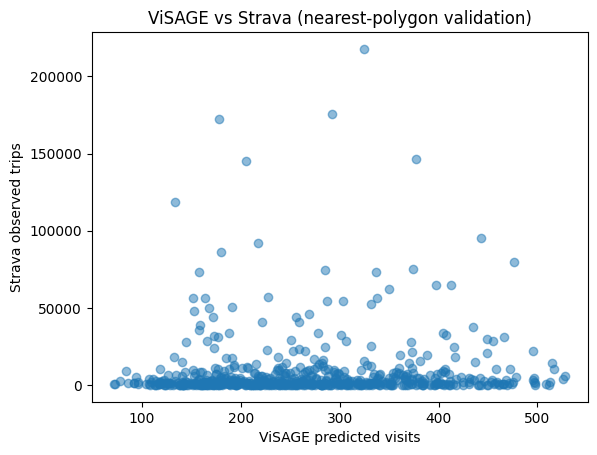

In [85]:
import matplotlib.pyplot as plt

plt.scatter(
    validation["visage_pred"],
    validation["strava_trips"],
    alpha=0.5
)
plt.xlabel("ViSAGE predicted visits")
plt.ylabel("Strava observed trips")
plt.title("ViSAGE vs Strava (nearest-polygon validation)")
plt.show()


In [86]:
import numpy as np
from sklearn.neighbors import BallTree

# k = number of nearest ViSAGE sites to consider
k = 5

# ViSAGE centroids (as array)
X_site = np.vstack([site_catalogue["cx_site"], site_catalogue["cy_site"]]).T

# Strava centroids (as array)
X_strava = np.vstack([strava_unique["cx_strava"], strava_unique["cy_strava"]]).T

tree = BallTree(X_site, leaf_size=15)

# distances: (n_strava, k), indices: (n_strava, k)
distances, indices = tree.query(X_strava, k=k)

# Avoid zero distances (for weighting)
distances = np.where(distances == 0, 1e-6, distances)

# Inverse-distance weights, normalised per Strava polygon
weights = 1 / distances
weights = weights / weights.sum(axis=1, keepdims=True)


In [87]:
# Repeat Strava IDs and trips for each of the k neighbours
n_strava = len(strava_unique)

strava_ids_rep = np.repeat(strava_unique.index.values, k)
dest_indices_flat = indices.flatten()
weights_flat = weights.flatten()

# Map ViSAGE dest_id via site_catalogue index
dest_ids_flat = site_catalogue.iloc[dest_indices_flat]["dest_id"].values

# Strava trips per polygon (make sure this is the right column)
strava_trips_rep = np.repeat(
    strava_unique["strava_total_trip_count"].values,
    k
)

# Weighted contribution to each ViSAGE site
weighted_trips = strava_trips_rep * weights_flat

weighted_df = pd.DataFrame({
    "dest_id": dest_ids_flat,
    "weighted_trips": weighted_trips
})


In [88]:
strava_by_site_weighted = (
    weighted_df.groupby("dest_id")["weighted_trips"]
    .sum()
    .reset_index()
    .rename(columns={"weighted_trips": "strava_trips_weighted"})
)


In [90]:
import pandas as pd

# Load simulated visits
visits = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_simulated_visits.csv"
)

# Aggregate to site-level predictions
visage_site_pred = (
    visits.groupby("site_id")["visits"]
    .sum()
    .reset_index()
    .rename(columns={"visits": "visage_pred"})
)

visage_site_pred.head()


,site_id,visage_pred
0,0,238.072921
1,1,516.787899
2,2,204.821468
3,3,182.654181
4,4,140.008769


In [91]:
site_catalogue = site_catalogue.merge(
    visage_site_pred,
    on="site_id",
    how="left"
)


In [92]:
validation_w = (
    site_catalogue
    .merge(strava_by_site_weighted, on="dest_id", how="left")
)


In [94]:
site_catalogue.columns


Index(['site_id', 'northing', 'easting', 'dataset', 'Unnamed: 0', 'has_agi',
       'has_sssi', 'has_sac', 'is_protected', 'designation_count', 'geometry',
       'dest_id', 'area_site', 'cx_site', 'cy_site', 'visage_pred_x',
       'visage_pred_y'],
      dtype='str')

In [95]:
site_catalogue["site_id"].head()
site_catalogue["site_id"].dtype


dtype('float64')

In [97]:
site_catalogue = site_catalogue.merge(
    visage_site_pred,
    on="site_id",
    how="left"
)


ValueError: The column label 'site_id' is not unique.

In [98]:
[x for x in site_catalogue.columns if x == "site_id"]


['site_id', 'site_id']

In [99]:
site_catalogue.columns


Index(['site_id', 'site_id', 'northing', 'easting', 'dataset', 'Unnamed: 0',
       'has_agi', 'has_sssi', 'has_sac', 'is_protected', 'designation_count',
       'geometry', 'dest_id', 'area_site', 'cx_site', 'cy_site',
       'visage_pred_x', 'visage_pred_y'],
      dtype='str')

In [100]:
site_catalogue.filter(regex="site_id").head()


,site_id,site_id
0,0,0.0
1,1,1.0
2,2,2.0
3,3,3.0
4,4,4.0


In [101]:
# Identify the two site_id columns
cols = site_catalogue.filter(regex="site_id").columns

# First is correct (integer), second is wrong (string)
correct = cols[0]
wrong = cols[1]

# Rename the wrong one
site_catalogue = site_catalogue.rename(columns={wrong: "dest_id"})


In [102]:
site_catalogue.columns


Index(['dest_id', 'dest_id', 'northing', 'easting', 'dataset', 'Unnamed: 0',
       'has_agi', 'has_sssi', 'has_sac', 'is_protected', 'designation_count',
       'geometry', 'dest_id', 'area_site', 'cx_site', 'cy_site',
       'visage_pred_x', 'visage_pred_y'],
      dtype='str')

In [103]:
site_catalogue.filter(regex="dest_id").head()


,dest_id,dest_id,dest_id
0,0,0.0,gs_0001
1,1,1.0,gs_0002
2,2,2.0,gs_0003
3,3,3.0,gs_0004
4,4,4.0,gs_0005


In [104]:
site_catalogue.filter(regex="site_id").head()


""
0
1
2
3
4


In [105]:
site_catalogue.filter(regex="visage_pred").head()


,visage_pred_x,visage_pred_y
0,238.072921,238.072921
1,516.787899,516.787899
2,204.821468,204.821468
3,182.654181,182.654181
4,140.008769,140.008769


In [106]:
# Remove duplicate column names by keeping the first occurrence
site_catalogue = site_catalogue.loc[:, ~site_catalogue.columns.duplicated()]


In [96]:
site_catalogue = site_catalogue.reset_index().rename(columns={"index": "site_id"})


In [107]:
site_catalogue.columns


Index(['dest_id', 'northing', 'easting', 'dataset', 'Unnamed: 0', 'has_agi',
       'has_sssi', 'has_sac', 'is_protected', 'designation_count', 'geometry',
       'area_site', 'cx_site', 'cy_site', 'visage_pred_x', 'visage_pred_y'],
      dtype='str')

In [108]:
site_catalogue = site_catalogue.reset_index().rename(columns={"index": "site_id"})


In [109]:
site_catalogue["site_id"].head()


0    0
1    1
2    2
3    3
4    4
Name: site_id, dtype: int64

In [110]:
site_catalogue.columns


Index(['site_id', 'dest_id', 'northing', 'easting', 'dataset', 'Unnamed: 0',
       'has_agi', 'has_sssi', 'has_sac', 'is_protected', 'designation_count',
       'geometry', 'area_site', 'cx_site', 'cy_site', 'visage_pred_x',
       'visage_pred_y'],
      dtype='str')

In [111]:
site_catalogue = site_catalogue.drop(
    columns=[c for c in site_catalogue.columns if "visage_pred" in c],
    errors="ignore"
)


In [112]:
site_catalogue.columns


Index(['site_id', 'dest_id', 'northing', 'easting', 'dataset', 'Unnamed: 0',
       'has_agi', 'has_sssi', 'has_sac', 'is_protected', 'designation_count',
       'geometry', 'area_site', 'cx_site', 'cy_site'],
      dtype='str')

In [113]:
visage_site_pred = (
    visits.groupby("site_id")["visits"]
    .sum()
    .reset_index()
    .rename(columns={"visits": "visage_pred"})
)


In [114]:
visage_site_pred.head()


,site_id,visage_pred
0,0,238.072921
1,1,516.787899
2,2,204.821468
3,3,182.654181
4,4,140.008769


In [115]:
site_catalogue = site_catalogue.merge(
    visage_site_pred,
    on="site_id",
    how="left"
)


In [116]:
site_catalogue["visage_pred"].head()


0    238.072921
1    516.787899
2    204.821468
3    182.654181
4    140.008769
Name: visage_pred, dtype: float64

In [118]:
site_catalogue["dest_id"].dtype, strava_by_site_weighted["dest_id"].dtype


(dtype('int64'), <StringDtype(na_value=nan)>)

In [119]:
site_catalogue["dest_id"] = site_catalogue["dest_id"].astype(str)
strava_by_site_weighted["dest_id"] = strava_by_site_weighted["dest_id"].astype(str)


In [120]:
validation_w = (
    site_catalogue
    .merge(strava_by_site_weighted, on="dest_id", how="left")
)


In [121]:
from sklearn.metrics import r2_score

r2_w = r2_score(
    validation_w["strava_trips_weighted"].fillna(0),
    validation_w["visage_pred"].fillna(0)
)
r2_w


0.0

In [125]:
import numpy as np
from sklearn.metrics import r2_score

y_true = validation_w["strava_trips_weighted"].fillna(0)
y_pred = validation_w["visage_pred"].fillna(0)

r2_log = r2_score(
    np.log1p(y_true),
    np.log1p(y_pred)
)

r2_log


0.0

In [126]:
from scipy.stats import spearmanr

spearmanr(
    validation_w["strava_trips_weighted"],
    validation_w["visage_pred"]
)


SignificanceResult(statistic=nan, pvalue=nan)

In [127]:
validation_w["strava_trips_weighted"].describe()


count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: strava_trips_weighted, dtype: float64

In [128]:
strava_unique.shape


(3797, 22)

In [129]:
strava_unique["strava_total_trip_count"].describe()


count     3797.000000
mean      1776.336582
std       5289.395629
min          5.000000
25%         75.000000
50%        320.000000
75%       1210.000000
max      90320.000000
Name: strava_total_trip_count, dtype: float64

In [130]:
weighted_df.shape
strava_by_site_weighted.shape


(918, 2)

In [131]:
validation_w = (
    site_catalogue
    .merge(strava_by_site_weighted.rename(columns={"dest_id": "site_id"}), 
           on="site_id", 
           how="left")
)


ValueError: You are trying to merge on int64 and str columns for key 'site_id'. If you wish to proceed you should use pd.concat

In [132]:
site_catalogue["site_id"].dtype, strava_by_site_weighted["dest_id"].dtype


(dtype('int64'), <StringDtype(na_value=nan)>)

In [133]:
strava_by_site_weighted["dest_id"] = (
    strava_by_site_weighted["dest_id"]
    .astype("Int64")
    .astype(int)
)

strava_by_site_weighted = strava_by_site_weighted.rename(columns={"dest_id": "site_id"})

validation_w = (
    site_catalogue
    .merge(strava_by_site_weighted, on="site_id", how="left")
)

validation_w["strava_trips_weighted"].describe()


ArrowInvalid: Failed to parse string: 'gs_0918' as a scalar of type int64

In [135]:
strava_by_site_weighted["dest_id"].unique()[:20]


<ArrowStringArray>
['gs_0001', 'gs_0002', 'gs_0003', 'gs_0004', 'gs_0005', 'gs_0006', 'gs_0007',
 'gs_0008', 'gs_0009', 'gs_0010', 'gs_0011', 'gs_0012', 'gs_0013', 'gs_0014',
 'gs_0015', 'gs_0016', 'gs_0017', 'gs_0018', 'gs_0019', 'gs_0020']
Length: 20, dtype: str

In [138]:
strava_unique.columns


Index(['polygon_id', 'geometry', 'has_agi', 'has_sssi', 'has_sac',
       'is_protected', 'designation_count', 'Date', 'strava_total_trip_count',
       'strava_mean_trip_count', 'strava_n_edges', 'dataset_1', 'strava_id',
       'dataset_2', 'dest_id_2', 'dataset_3', 'dest_id_3', 'year', 'month',
       'cx_strava', 'cy_strava', 'nearest_dest_id'],
      dtype='str')

In [139]:
import numpy as np
from sklearn.neighbors import BallTree

# Convert to radians for haversine
site_coords = np.radians(
    np.vstack([site_catalogue["cy_site"], site_catalogue["cx_site"]]).T
)

tree = BallTree(site_coords, leaf_size=15, metric='haversine')


In [140]:
strava_coords = np.radians(
    np.vstack([strava_unique["cy_strava"], strava_unique["cx_strava"]]).T
)


In [141]:
distances, indices = tree.query(strava_coords, k=5)


In [142]:
weights = 1 / (distances + 1e-9)
weights = weights / weights.sum(axis=1, keepdims=True)

rows = []
for i in range(len(strava_unique)):
    for j in range(weights.shape[1]):
        rows.append({
            "site_id": int(indices[i, j]),
            "strava_trips_weighted": float(
                weights[i, j] * strava_unique.iloc[i]["strava_total_trip_count"]
            )
        })

weighted_df = pd.DataFrame(rows)

strava_by_site_weighted = (
    weighted_df.groupby("site_id")["strava_trips_weighted"]
    .sum()
    .reset_index()
)


In [143]:
validation_w = site_catalogue.merge(
    strava_by_site_weighted,
    on="site_id",
    how="left"
)


In [144]:
from sklearn.metrics import r2_score

r2_w = r2_score(
    validation_w["strava_trips_weighted"].fillna(0),
    validation_w["visage_pred"].fillna(0)
)
r2_w


-0.111498046368806

In [145]:
from scipy.stats import spearmanr

spearmanr(
    validation_w["strava_trips_weighted"].fillna(0),
    validation_w["visage_pred"].fillna(0)
)


SignificanceResult(statistic=np.float64(0.1241561424933081), pvalue=np.float64(0.0001624503110946545))

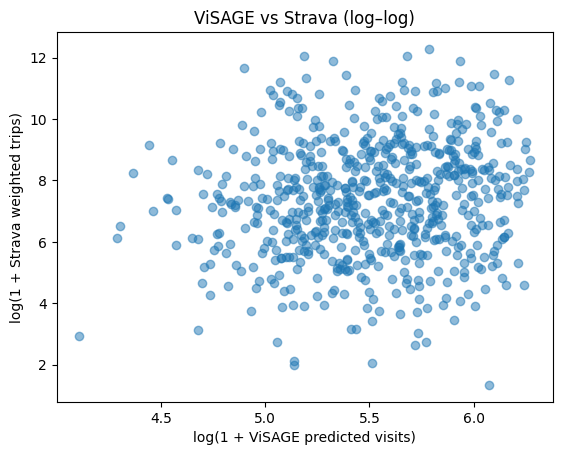

In [146]:
import matplotlib.pyplot as plt
import numpy as np

plt.scatter(
    np.log1p(validation_w["visage_pred"]),
    np.log1p(validation_w["strava_trips_weighted"]),
    alpha=0.5
)
plt.xlabel("log(1 + ViSAGE predicted visits)")
plt.ylabel("log(1 + Strava weighted trips)")
plt.title("ViSAGE vs Strava (log–log)")
plt.show()


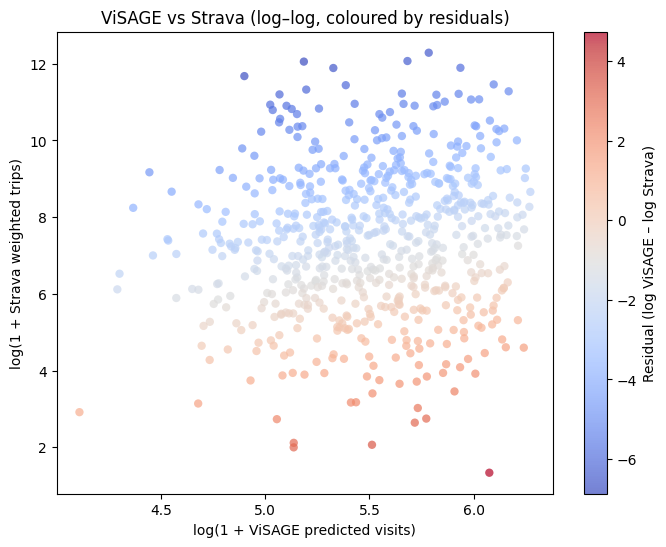

In [147]:
import numpy as np
import matplotlib.pyplot as plt

# Log-transform
log_visage = np.log1p(validation_w["visage_pred"])
log_strava = np.log1p(validation_w["strava_trips_weighted"].fillna(0))

# Residuals
residuals = log_visage - log_strava

plt.figure(figsize=(8,6))
scatter = plt.scatter(
    log_visage,
    log_strava,
    c=residuals,
    cmap="coolwarm",
    alpha=0.7,
    edgecolor="none"
)

plt.colorbar(scatter, label="Residual (log ViSAGE – log Strava)")
plt.xlabel("log(1 + ViSAGE predicted visits)")
plt.ylabel("log(1 + Strava weighted trips)")
plt.title("ViSAGE vs Strava (log–log, coloured by residuals)")

plt.show()


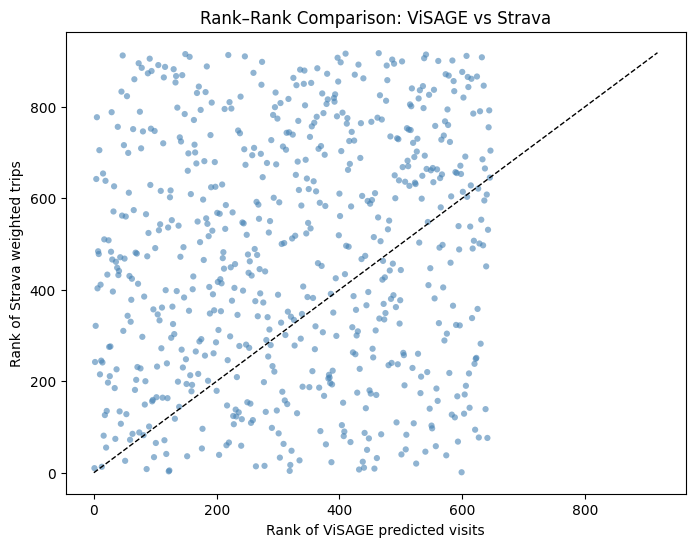

In [148]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Extract the two variables
visage = validation_w["visage_pred"]
strava = validation_w["strava_trips_weighted"].fillna(0)

# Compute ranks (average method is fine)
visage_rank = visage.rank(method="average")
strava_rank = strava.rank(method="average")

plt.figure(figsize=(8,6))
plt.scatter(
    visage_rank,
    strava_rank,
    alpha=0.6,
    s=20,
    c="steelblue",
    edgecolor="none"
)

# Add diagonal reference line
max_rank = max(visage_rank.max(), strava_rank.max())
plt.plot([0, max_rank], [0, max_rank], color="black", linestyle="--", linewidth=1)

plt.xlabel("Rank of ViSAGE predicted visits")
plt.ylabel("Rank of Strava weighted trips")
plt.title("Rank–Rank Comparison: ViSAGE vs Strava")

plt.show()


In [149]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import spearmanr

# Extract variables
visage = validation_w["visage_pred"]
strava = validation_w["strava_trips_weighted"].fillna(0)

# Compute ranks
visage_rank = visage.rank(method="average")
strava_rank = strava.rank(method="average")

# Max rank for diagonal reference
max_rank = max(visage_rank.max(), strava_rank.max())

# Residuals for plots that need them
residuals = np.log1p(visage) - np.log1p(strava)


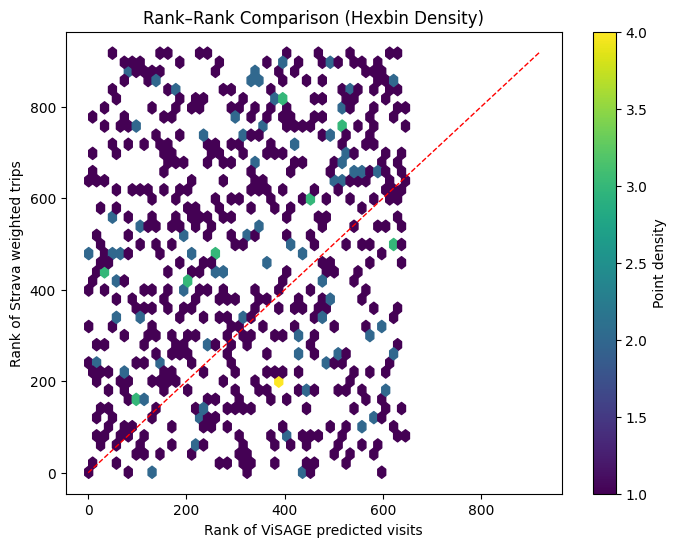

In [151]:
plt.figure(figsize=(8,6))

hb = plt.hexbin(
    visage_rank,
    strava_rank,
    gridsize=40,
    cmap="viridis",
    mincnt=1
)

plt.plot([0, max_rank], [0, max_rank], 'r--', linewidth=1)
plt.colorbar(hb, label="Point density")

plt.xlabel("Rank of ViSAGE predicted visits")
plt.ylabel("Rank of Strava weighted trips")
plt.title("Rank–Rank Comparison (Hexbin Density)")

plt.show()



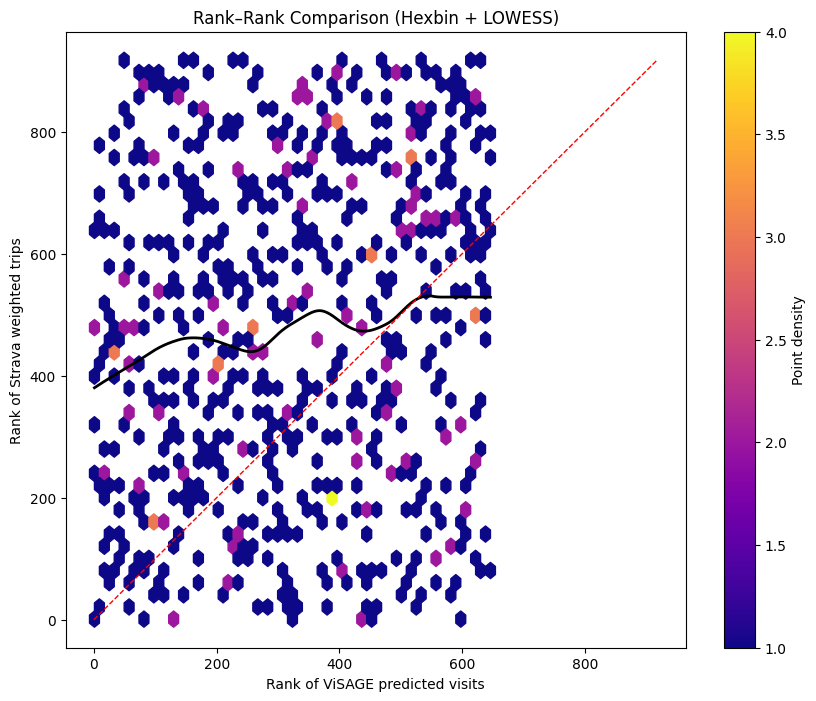

In [159]:
plt.figure(figsize=(10,8))

hb = plt.hexbin(
    visage_rank,
    strava_rank,
    gridsize=40,
    cmap="plasma",
    mincnt=1
)

# LOWESS smoothing
lowess = sm.nonparametric.lowess(strava_rank, visage_rank, frac=0.3)
plt.plot(lowess[:,0], lowess[:,1], color="black", linewidth=2)

plt.plot([0, max_rank], [0, max_rank], 'r--', linewidth=1)
plt.colorbar(hb, label="Point density")

plt.xlabel("Rank of ViSAGE predicted visits")
plt.ylabel("Rank of Strava weighted trips")
plt.title("Rank–Rank Comparison (Hexbin + LOWESS)")

plt.show()


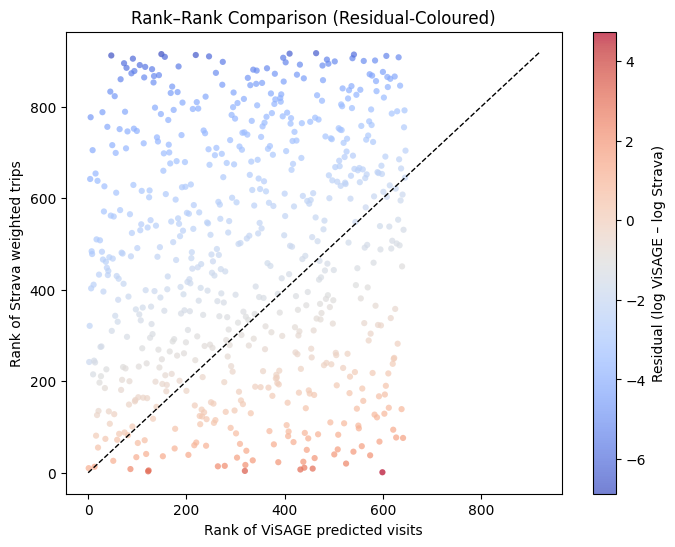

In [153]:
plt.figure(figsize=(8,6))

plt.scatter(
    visage_rank,
    strava_rank,
    c=residuals,
    cmap="coolwarm",
    alpha=0.7,
    s=20,
    edgecolor="none"
)

plt.plot([0, max_rank], [0, max_rank], 'k--', linewidth=1)
plt.colorbar(label="Residual (log ViSAGE – log Strava)")

plt.xlabel("Rank of ViSAGE predicted visits")
plt.ylabel("Rank of Strava weighted trips")
plt.title("Rank–Rank Comparison (Residual-Coloured)")

plt.show()


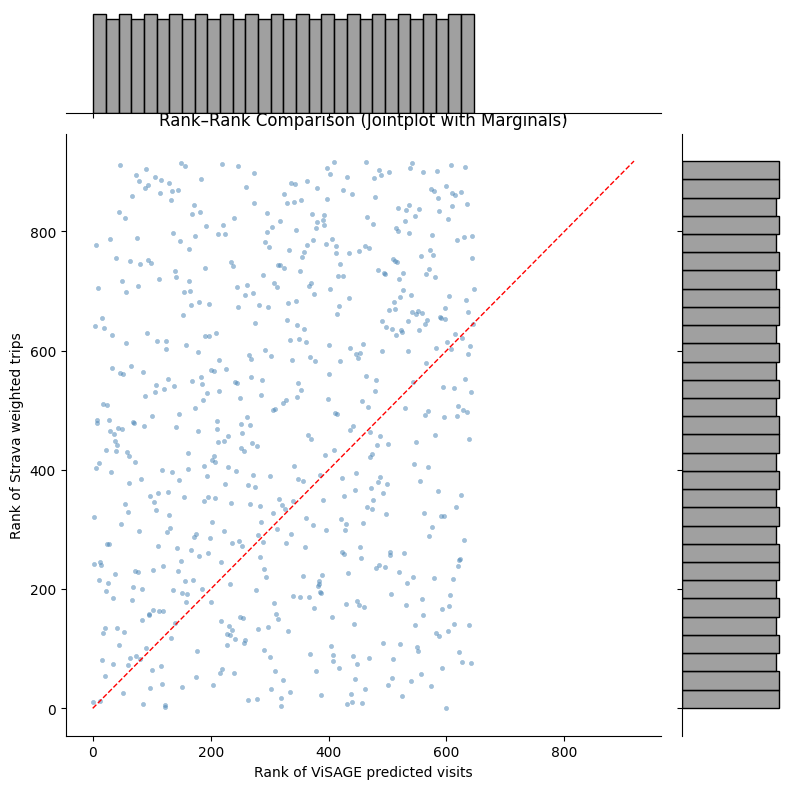

In [154]:
df = pd.DataFrame({
    "visage_rank": visage_rank,
    "strava_rank": strava_rank
})

g = sns.JointGrid(
    data=df,
    x="visage_rank",
    y="strava_rank",
    height=8
)

# Joint scatter
g.plot_joint(
    sns.scatterplot,
    s=10,
    alpha=0.5,
    color="steelblue",
    edgecolor=None
)

# Marginal histograms
g.plot_marginals(
    sns.histplot,
    kde=False,
    bins=30,
    color="grey"
)

# Diagonal reference
g.ax_joint.plot([0, max_rank], [0, max_rank], 'r--', linewidth=1)

g.ax_joint.set_xlabel("Rank of ViSAGE predicted visits")
g.ax_joint.set_ylabel("Rank of Strava weighted trips")
g.ax_joint.set_title("Rank–Rank Comparison (Jointplot with Marginals)")

plt.show()


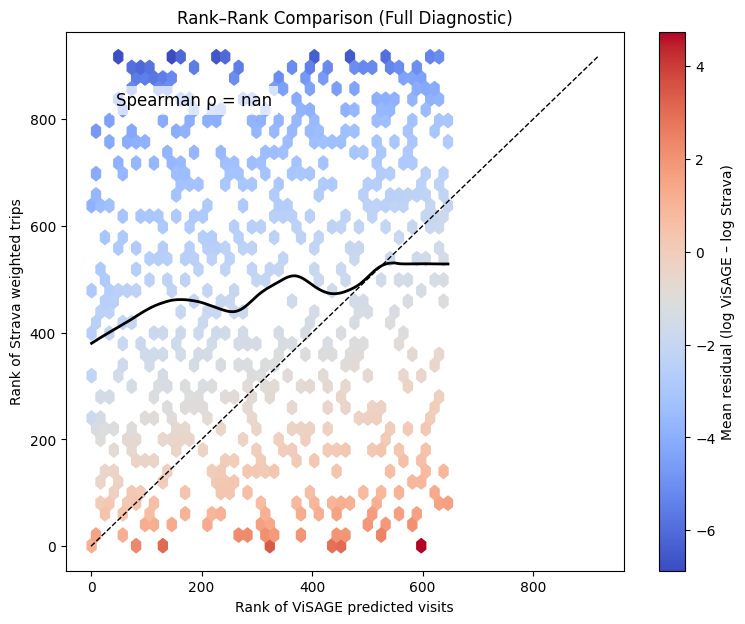

In [155]:
plt.figure(figsize=(9,7))

hb = plt.hexbin(
    visage_rank,
    strava_rank,
    C=residuals,
    reduce_C_function=np.mean,
    gridsize=40,
    cmap="coolwarm",
    mincnt=1
)

# LOWESS smoothing
lowess = sm.nonparametric.lowess(strava_rank, visage_rank, frac=0.3)
plt.plot(lowess[:,0], lowess[:,1], color="black", linewidth=2)

# Diagonal reference
plt.plot([0, max_rank], [0, max_rank], 'k--', linewidth=1)

plt.colorbar(hb, label="Mean residual (log ViSAGE – log Strava)")

plt.xlabel("Rank of ViSAGE predicted visits")
plt.ylabel("Rank of Strava weighted trips")
plt.title("Rank–Rank Comparison (Full Diagnostic)")

# Spearman annotation
rho = spearmanr(visage_rank, strava_rank).statistic
plt.text(
    0.05 * max_rank,
    0.9 * max_rank,
    f"Spearman ρ = {rho:.3f}",
    fontsize=12,
    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
)

plt.show()


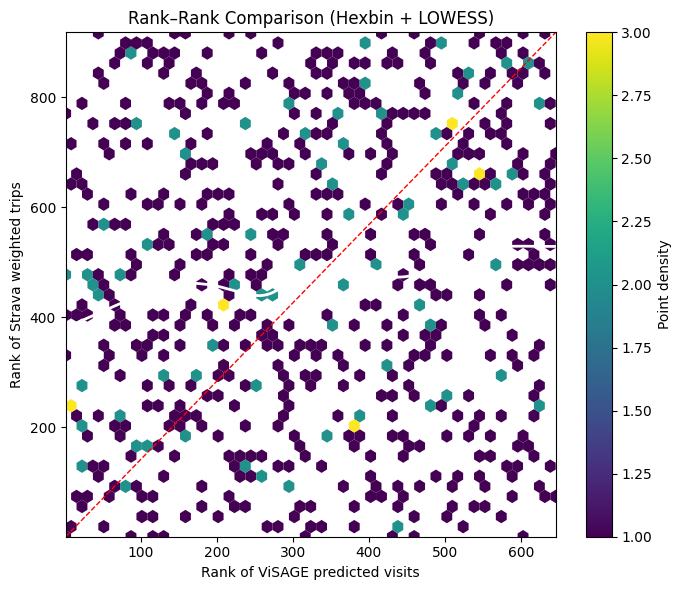

In [160]:
plt.figure(figsize=(7,6))

# Clip axes to actual rank range
xmin, xmax = visage_rank.min(), visage_rank.max()
ymin, ymax = strava_rank.min(), strava_rank.max()

hb = plt.hexbin(
    visage_rank,
    strava_rank,
    gridsize=45,
    cmap="viridis",
    mincnt=1,
    linewidths=0
)

# LOWESS smoothing
lowess = sm.nonparametric.lowess(strava_rank, visage_rank, frac=0.3)
plt.plot(lowess[:,0], lowess[:,1], color="white", linewidth=2)

# Diagonal
plt.plot([xmin, xmax], [ymin, ymax], 'r--', linewidth=1)

plt.colorbar(hb, label="Point density")

plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)

plt.xlabel("Rank of ViSAGE predicted visits")
plt.ylabel("Rank of Strava weighted trips")
plt.title("Rank–Rank Comparison (Hexbin + LOWESS)")

plt.tight_layout()
plt.show()


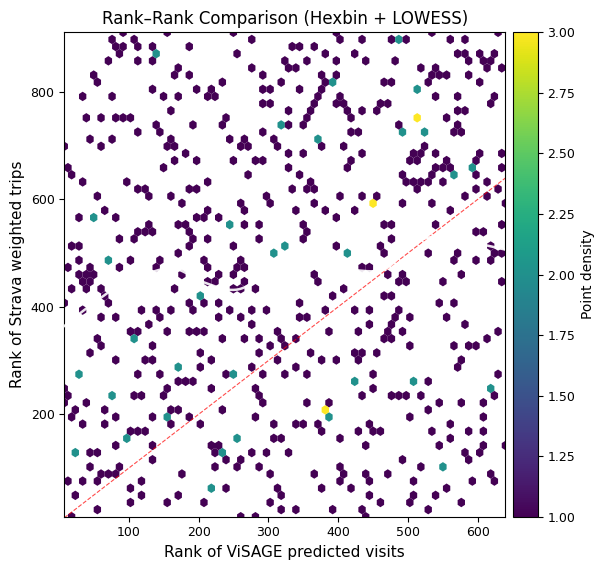

In [162]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. TRIM EXTREME OUTLIERS
#    (1st–99th percentile)
# -----------------------------
x_min, x_max = np.percentile(x, [1, 99])
y_min, y_max = np.percentile(y, [1, 99])

trim_mask = (x >= x_min) & (x <= x_max) & (y >= y_min) & (y <= y_max)
x = x[trim_mask]
y = y[trim_mask]

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (high resolution)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=60,
    cmap="viridis",
    mincnt=1,
    linewidths=0,
    extent=[x_min, x_max, y_min, y_max]
)

# -----------------------------
# 5. LOWESS SMOOTHING
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="white",
    linewidth=1.8,
    alpha=0.9,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.7
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


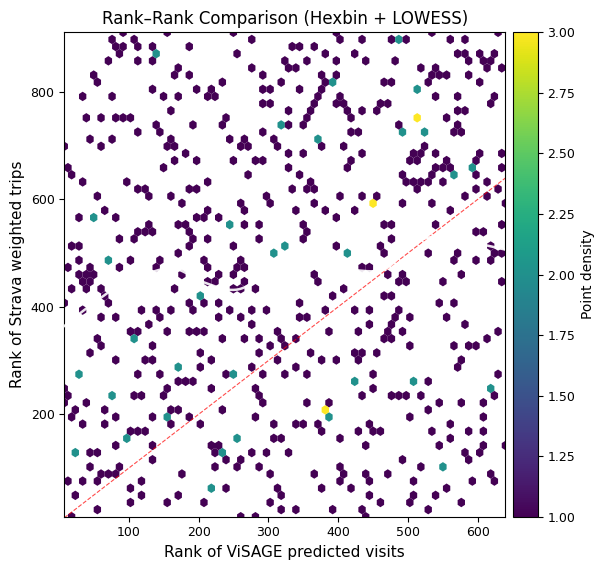

In [163]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. TRIM EXTREME OUTLIERS
#    (1st–99th percentile)
# -----------------------------
x_min, x_max = np.percentile(x, [1, 99])
y_min, y_max = np.percentile(y, [1, 99])

trim_mask = (x >= x_min) & (x <= x_max) & (y >= y_min) & (y <= y_max)
x = x[trim_mask]
y = y[trim_mask]

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (high resolution)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=60,
    cmap="viridis",
    mincnt=1,
    linewidths=0,
    extent=[x_min, x_max, y_min, y_max]
)

# -----------------------------
# 5. LOWESS SMOOTHING
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="white",
    linewidth=1.8,
    alpha=0.9,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.7
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


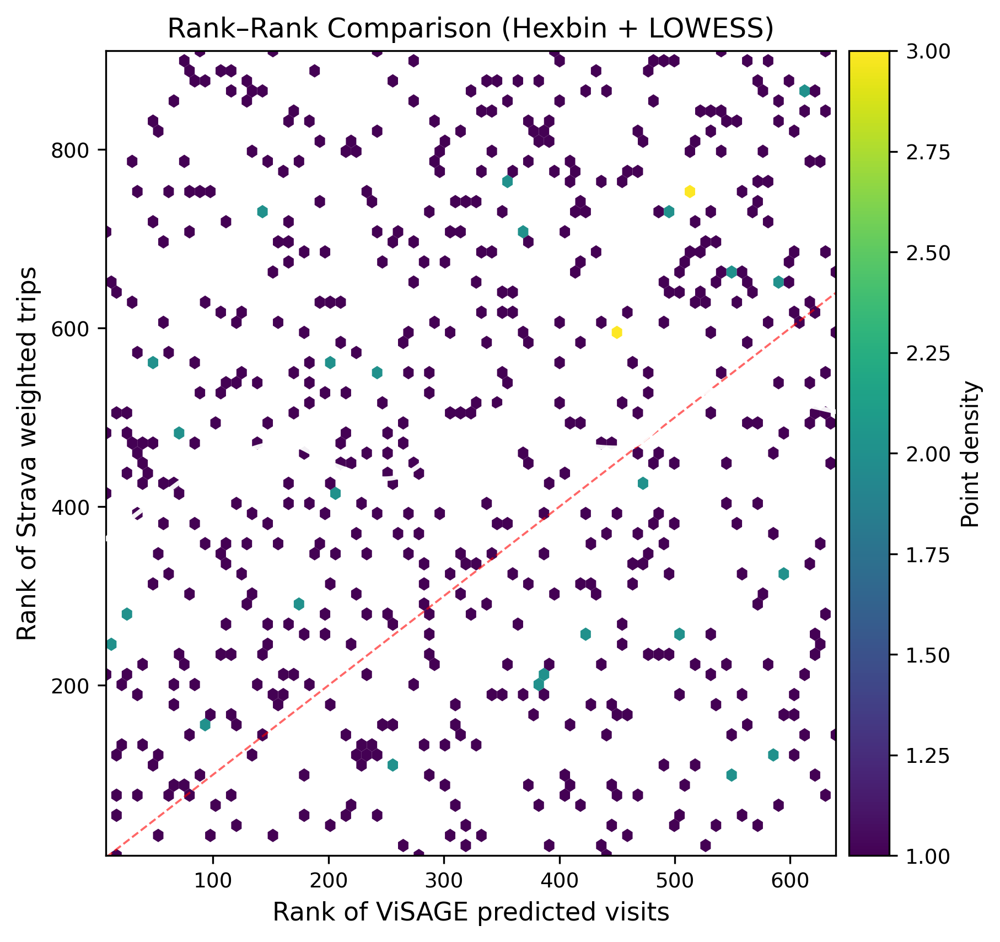

In [164]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. TRIM EXTREME OUTLIERS
#    (1st–99th percentile)
# -----------------------------
x_min, x_max = np.percentile(x, [1, 99])
y_min, y_max = np.percentile(y, [1, 99])

trim_mask = (x >= x_min) & (x <= x_max) & (y >= y_min) & (y <= y_max)
x = x[trim_mask]
y = y[trim_mask]

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (high resolution)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=70,          # higher resolution
    cmap="viridis",       # perceptually uniform
    mincnt=1,
    linewidths=0,
    extent=[x_min, x_max, y_min, y_max]
)

# -----------------------------
# 5. LOWESS SMOOTHING
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="white",
    linewidth=2.0,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.9,
    alpha=0.6
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


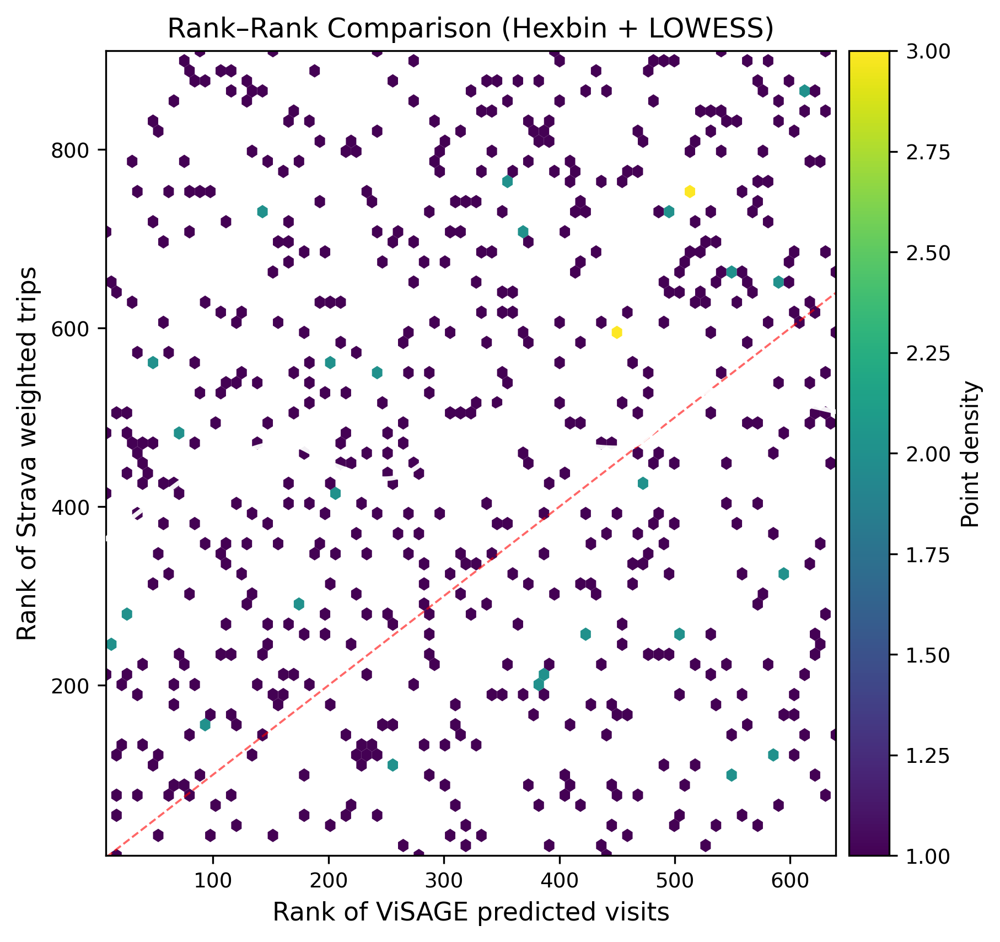

In [165]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. TRIM EXTREME OUTLIERS
#    (1st–99th percentile)
# -----------------------------
x_min, x_max = np.percentile(x, [1, 99])
y_min, y_max = np.percentile(y, [1, 99])

trim_mask = (x >= x_min) & (x <= x_max) & (y >= y_min) & (y <= y_max)
x = x[trim_mask]
y = y[trim_mask]

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (high resolution)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=70,          # higher resolution
    cmap="viridis",       # perceptually uniform
    mincnt=1,
    linewidths=0,
    extent=[x_min, x_max, y_min, y_max]
)

# -----------------------------
# 5. LOWESS SMOOTHING
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="white",
    linewidth=2.0,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.9,
    alpha=0.6
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


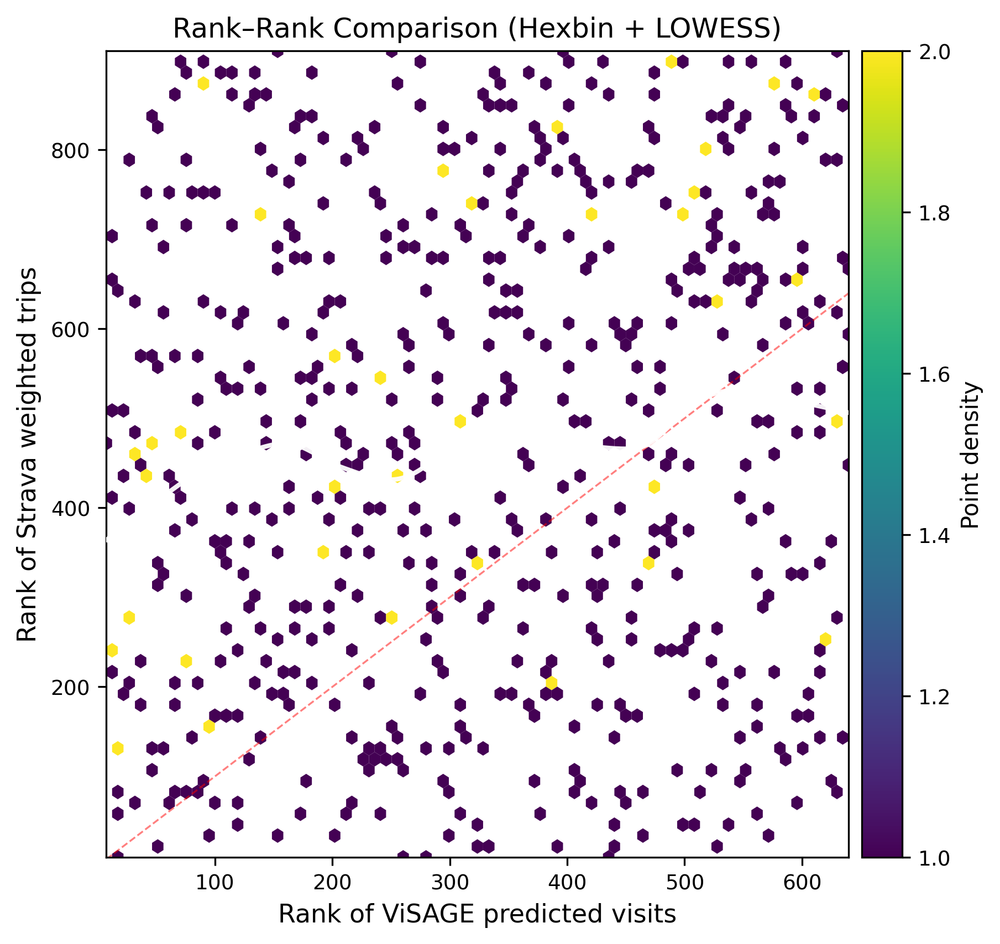

In [167]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. TRIM EXTREME OUTLIERS
# -----------------------------
x_min, x_max = np.percentile(x, [1, 99])
y_min, y_max = np.percentile(y, [1, 99])

trim_mask = (x >= x_min) & (x <= x_max) & (y >= y_min) & (y <= y_max)
x = x[trim_mask]
y = y[trim_mask]

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (CEUS aesthetic)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=65,
    cmap="viridis",       # ← DO NOT REVERSE
    mincnt=1,
    linewidths=0,
    extent=[x_min, x_max, y_min, y_max]
)

# -----------------------------
# 5. LOWESS SMOOTHING
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="white",
    linewidth=2.0,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


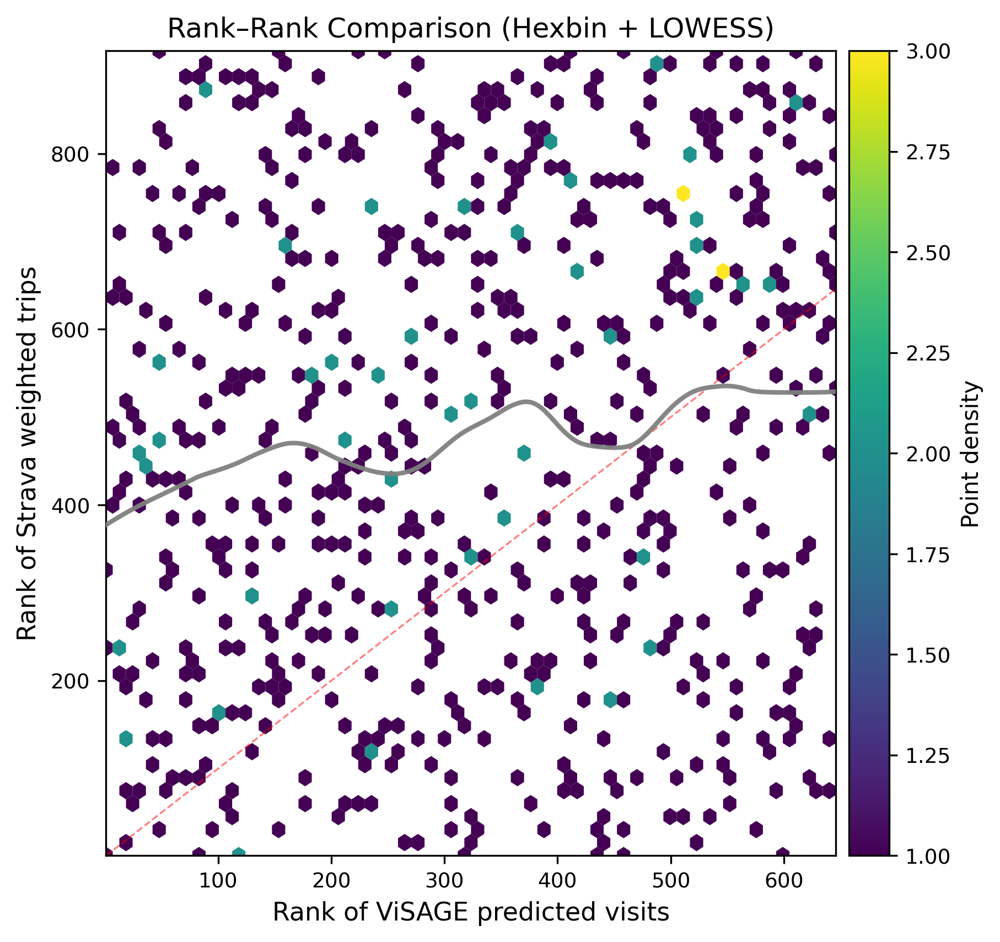

In [169]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. DO NOT TRIM OUTLIERS
#    (your ranks are meaningful at the edges)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (moderate resolution)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=55,          # moderate, preserves structure
    cmap="viridis",       # correct orientation
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 5. LOWESS SMOOTHING
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="grey",
    linewidth=2.0,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


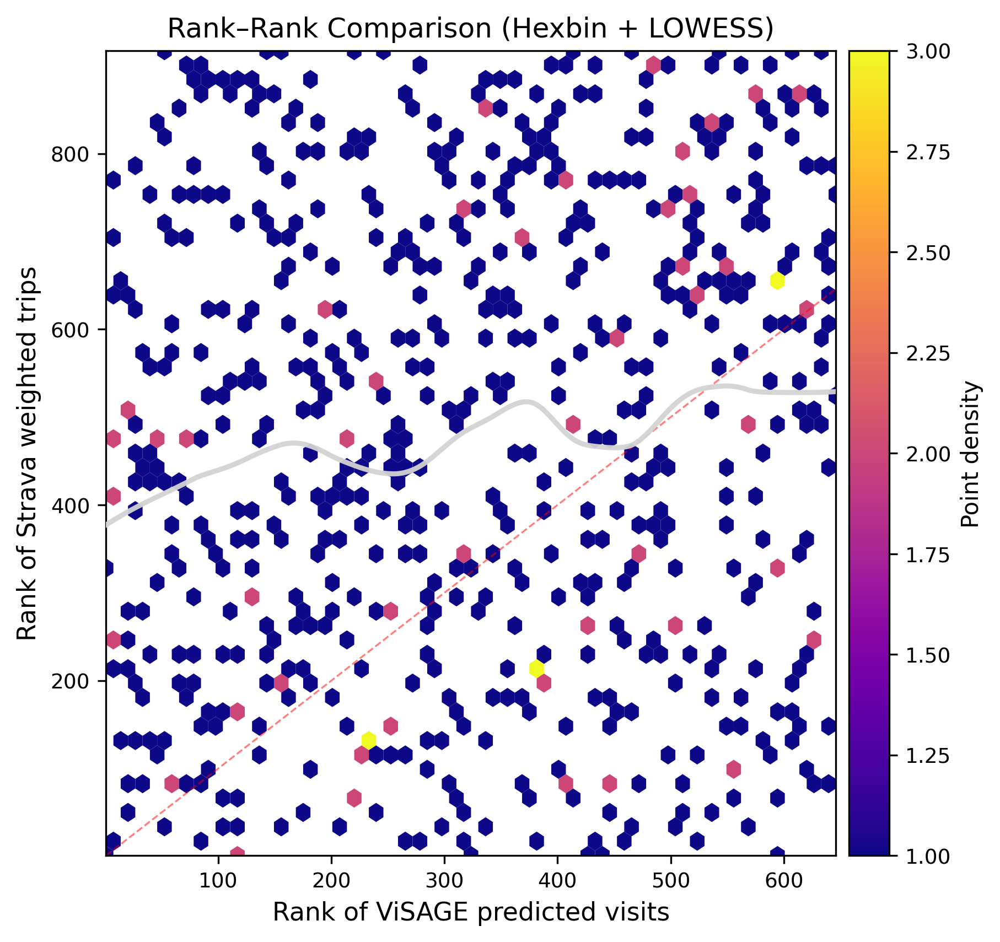

In [171]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (medium resolution)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,          # ← THIS is the correct level
    cmap="plasma",
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 5. LOWESS (grey, not white)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",    # ← THIS is the key fix
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


C:\Users\thoma\AppData\Local\Temp\ipykernel_5268\2682767019.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  vir = cm.get_cmap('viridis', 256)


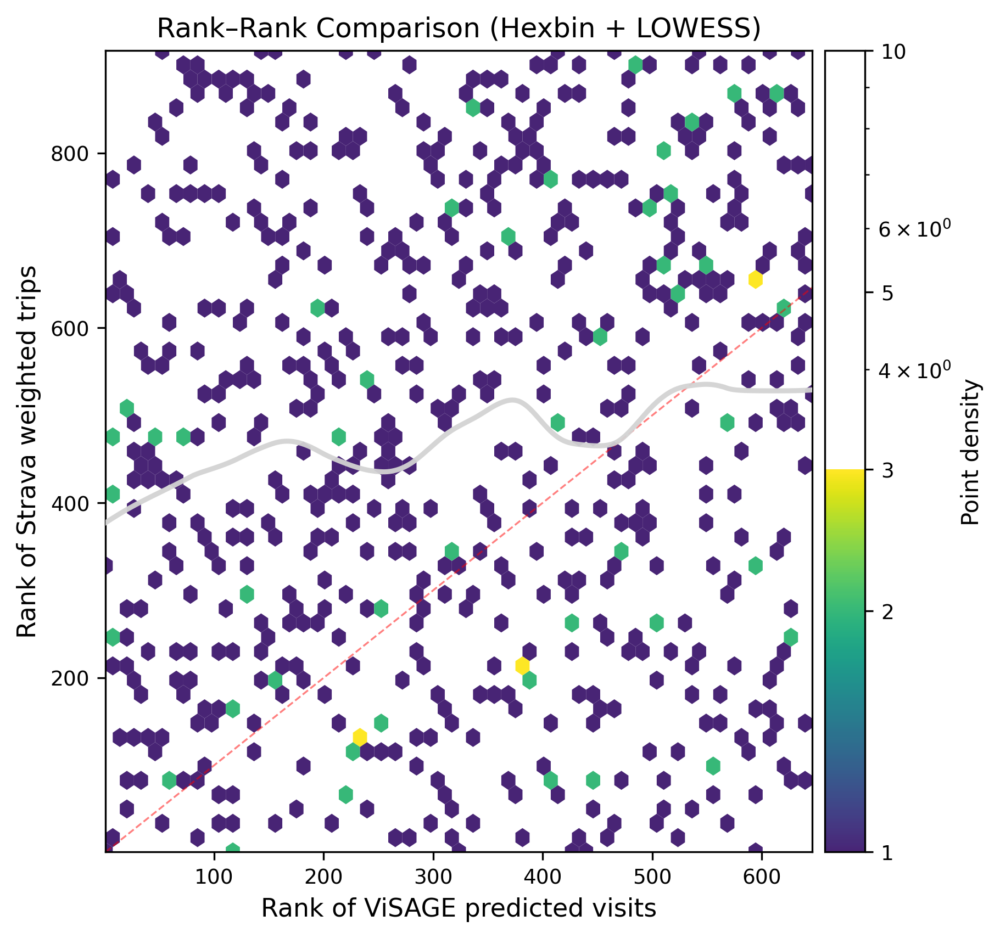

In [173]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from matplotlib.colors import LogNorm, ListedColormap
import matplotlib.cm as cm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CREATE A LIFTED VIRIDIS
#    (brightens the lower end)
# -----------------------------
vir = cm.get_cmap('viridis', 256)
lifted = ListedColormap(vir(np.linspace(0.10, 1, 256)))

# -----------------------------
# 4. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 5. HEXBIN (LogNorm + lifted viridis)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,
    cmap=lifted,
    mincnt=1,
    linewidths=0,
    norm=LogNorm()
)

# -----------------------------
# 6. LOWESS (grey for contrast)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 7. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 8. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 9. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# CEUS-style ticks for log scale
cbar.set_ticks([1, 2, 3, 5, 10])
cbar.set_ticklabels(["1", "2", "3", "5", "10"])

# -----------------------------
# 10. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


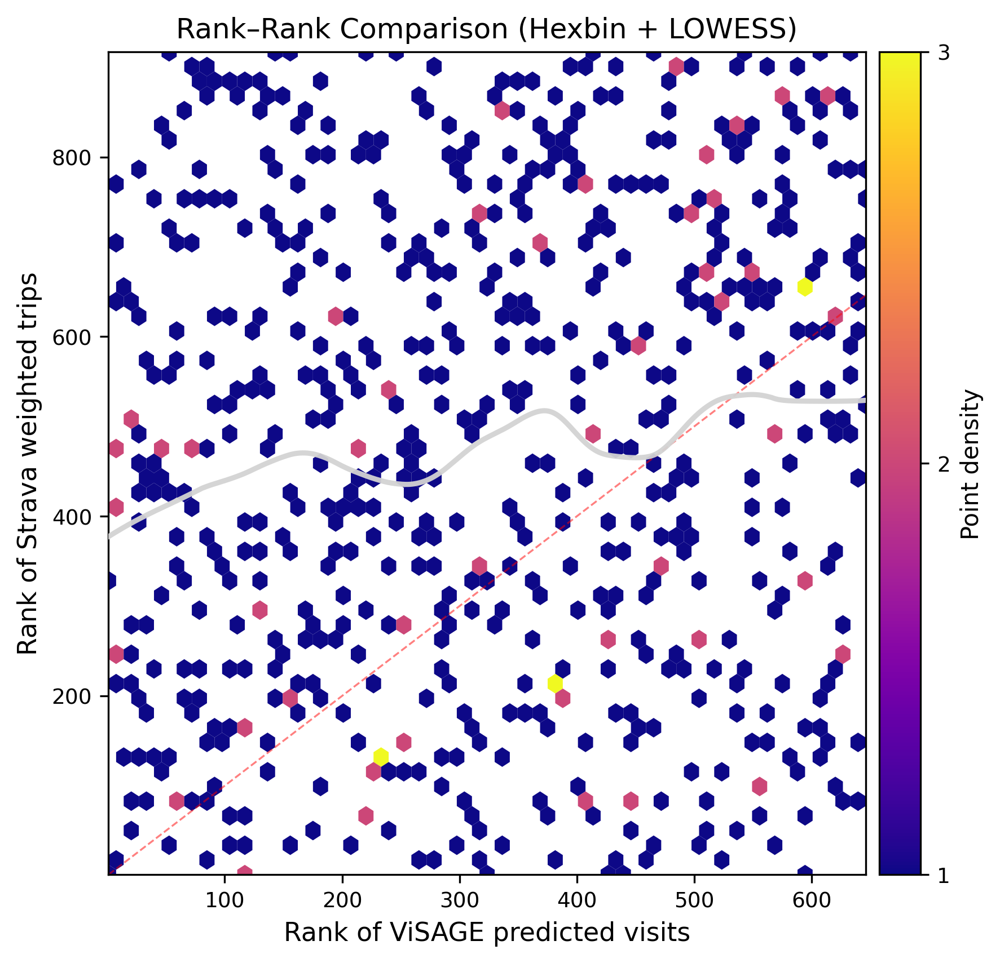

In [174]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (Plasma, no log)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,          # matches your original structure
    cmap="plasma",        # your requested ramp
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 5. LOWESS (grey for visibility)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# CEUS-style minimal ticks
dens_min = hb.get_array().min()
dens_max = hb.get_array().max()
cbar.set_ticks([dens_min, (dens_min+dens_max)/2, dens_max])
cbar.set_ticklabels([
    f"{dens_min:.0f}",
    f"{(dens_min+dens_max)/2:.0f}",
    f"{dens_max:.0f}"
])

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


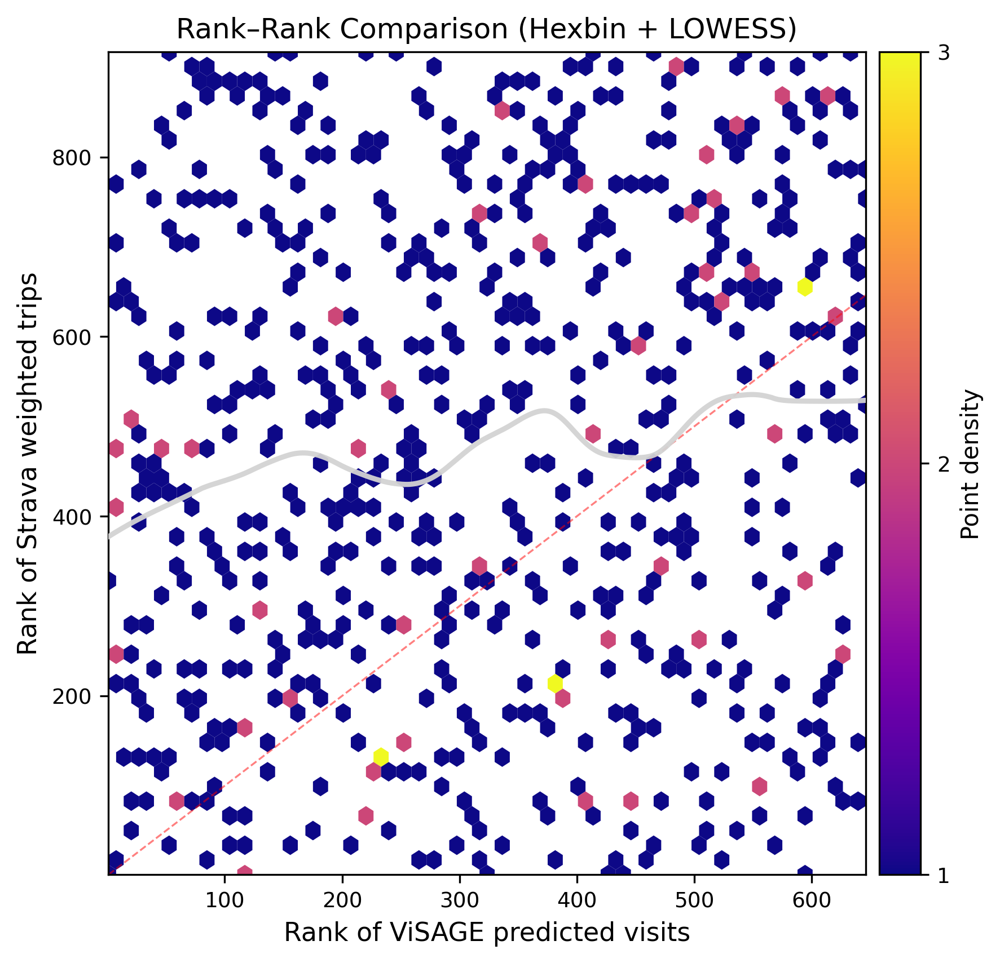

In [175]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 4. HEXBIN (Plasma, no log)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,          # matches your original structure
    cmap="plasma",        # your requested ramp
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 5. LOWESS (grey for visibility)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 6. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 7. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 8. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

# CEUS-style minimal ticks
dens_min = hb.get_array().min()
dens_max = hb.get_array().max()
cbar.set_ticks([dens_min, (dens_min+dens_max)/2, dens_max])
cbar.set_ticklabels([
    f"{dens_min:.0f}",
    f"{(dens_min+dens_max)/2:.0f}",
    f"{dens_max:.0f}"
])

# -----------------------------
# 9. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


C:\Users\thoma\AppData\Local\Temp\ipykernel_5268\2939821194.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap('plasma', 256)


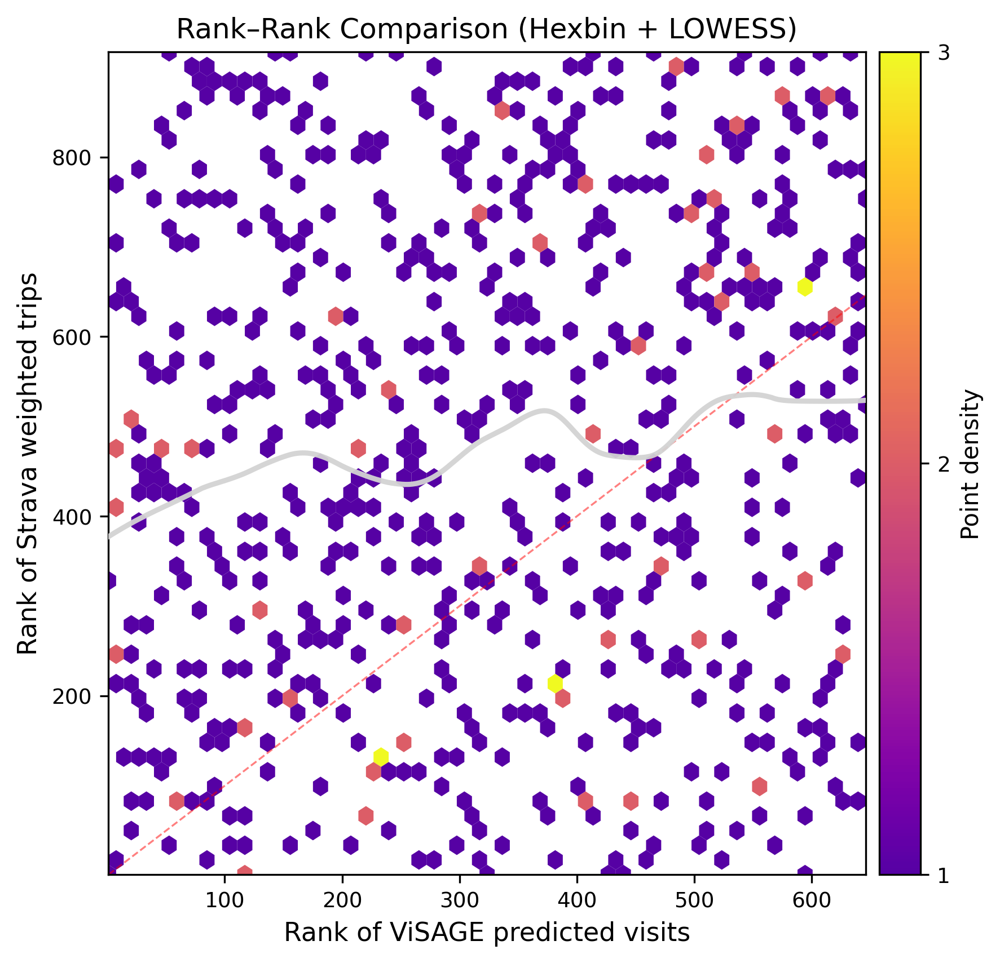

In [176]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib.cm as cm
import matplotlib.colors as colors

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CREATE TRUNCATED PLASMA
#    (brightens low-density bins)
# -----------------------------
plasma = cm.get_cmap('plasma', 256)
trunc_plasma = colors.ListedColormap(plasma(np.linspace(0.15, 1, 256)))
# ↑ lifting the lower 15% gives you the variation you want

# -----------------------------
# 4. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 5. HEXBIN (Plasma, truncated)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,
    cmap=trunc_plasma,
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 6. LOWESS (grey for visibility)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 7. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 8. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 9. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

dens_min = hb.get_array().min()
dens_max = hb.get_array().max()
cbar.set_ticks([dens_min, (dens_min+dens_max)/2, dens_max])
cbar.set_ticklabels([
    f"{dens_min:.0f}",
    f"{(dens_min+dens_max)/2:.0f}",
    f"{dens_max:.0f}"
])

# -----------------------------
# 10. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


C:\Users\thoma\AppData\Local\Temp\ipykernel_5268\2939821194.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap('plasma', 256)


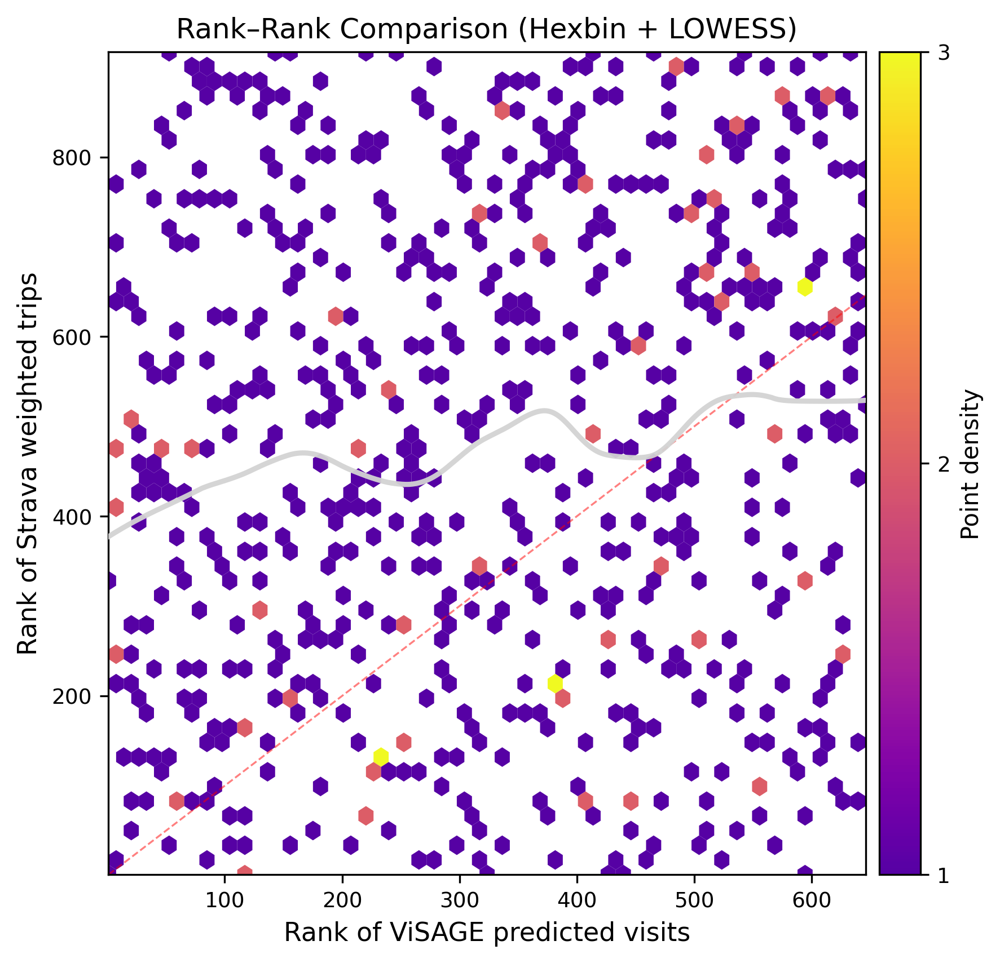

In [177]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib.cm as cm
import matplotlib.colors as colors

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CREATE TRUNCATED PLASMA
#    (brightens low-density bins)
# -----------------------------
plasma = cm.get_cmap('plasma', 256)
trunc_plasma = colors.ListedColormap(plasma(np.linspace(0.15, 1, 256)))
# ↑ lifting the lower 15% gives you the variation you want

# -----------------------------
# 4. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 5. HEXBIN (Plasma, truncated)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,
    cmap=trunc_plasma,
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 6. LOWESS (grey for visibility)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 7. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 8. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 9. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

dens_min = hb.get_array().min()
dens_max = hb.get_array().max()
cbar.set_ticks([dens_min, (dens_min+dens_max)/2, dens_max])
cbar.set_ticklabels([
    f"{dens_min:.0f}",
    f"{(dens_min+dens_max)/2:.0f}",
    f"{dens_max:.0f}"
])

# -----------------------------
# 10. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


C:\Users\thoma\AppData\Local\Temp\ipykernel_5268\2939821194.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap('plasma', 256)


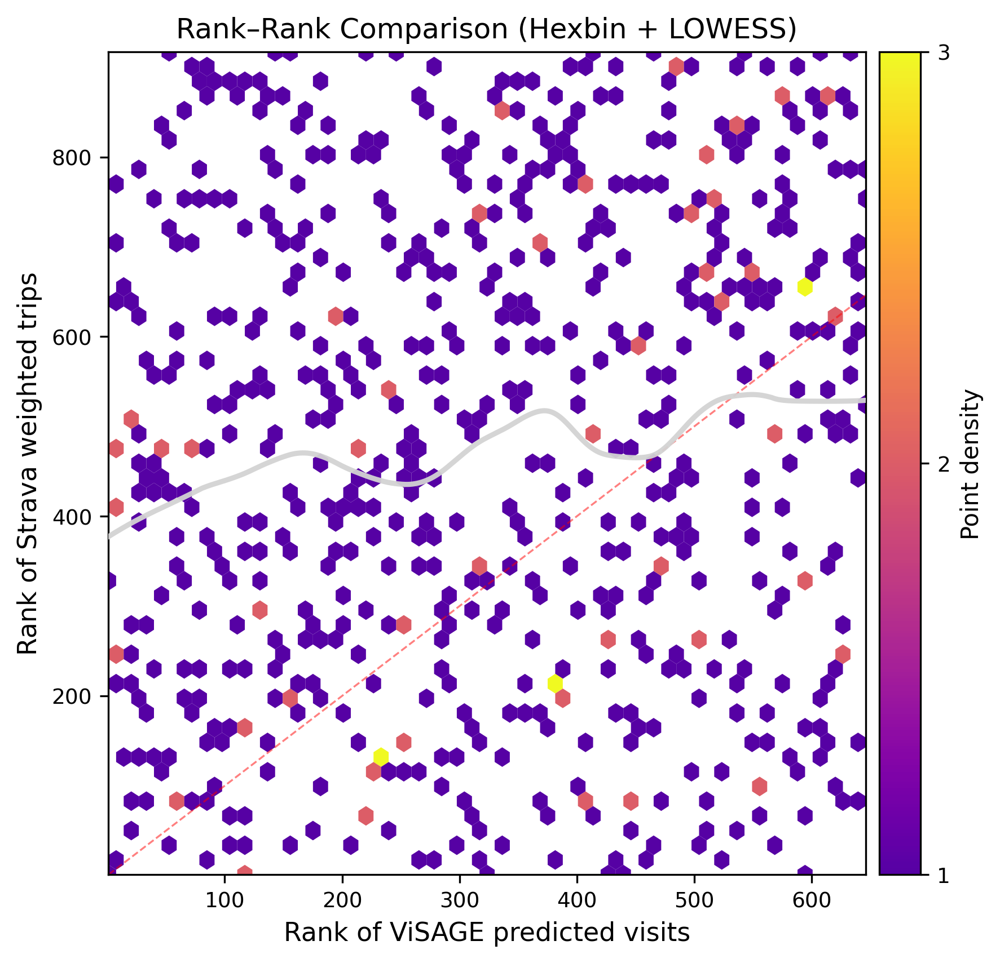

In [178]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib.cm as cm
import matplotlib.colors as colors

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CREATE TRUNCATED PLASMA
#    (brightens low-density bins)
# -----------------------------
plasma = cm.get_cmap('plasma', 256)
trunc_plasma = colors.ListedColormap(plasma(np.linspace(0.15, 1, 256)))
# ↑ lifting the lower 15% gives you the variation you want

# -----------------------------
# 4. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 5. HEXBIN (Plasma, truncated)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,
    cmap=trunc_plasma,
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 6. LOWESS (grey for visibility)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 7. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 8. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 9. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

dens_min = hb.get_array().min()
dens_max = hb.get_array().max()
cbar.set_ticks([dens_min, (dens_min+dens_max)/2, dens_max])
cbar.set_ticklabels([
    f"{dens_min:.0f}",
    f"{(dens_min+dens_max)/2:.0f}",
    f"{dens_max:.0f}"
])

# -----------------------------
# 10. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


C:\Users\thoma\AppData\Local\Temp\ipykernel_5268\2939821194.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap('plasma', 256)


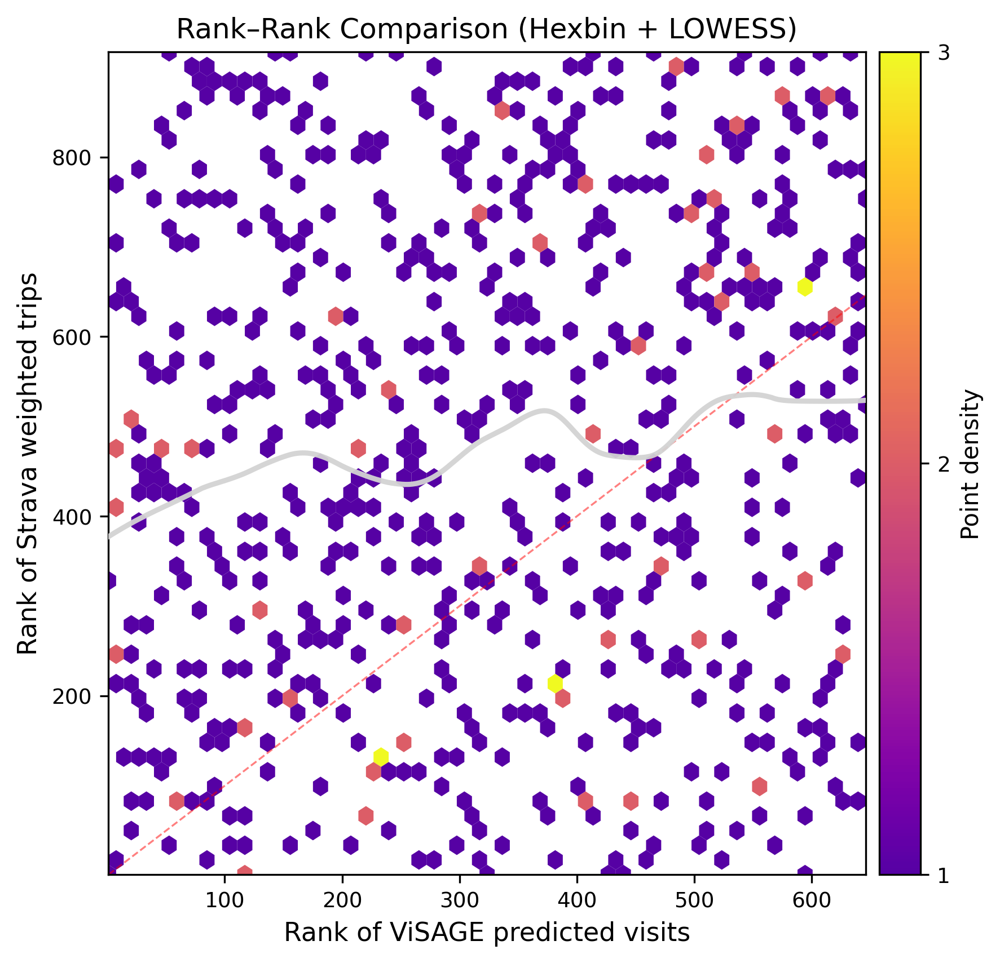

In [179]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib.cm as cm
import matplotlib.colors as colors

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CREATE TRUNCATED PLASMA
#    (brightens low-density bins)
# -----------------------------
plasma = cm.get_cmap('plasma', 256)
trunc_plasma = colors.ListedColormap(plasma(np.linspace(0.15, 1, 256)))
# ↑ lifting the lower 15% gives you the variation you want

# -----------------------------
# 4. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 5. HEXBIN (Plasma, truncated)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,
    cmap=trunc_plasma,
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 6. LOWESS (grey for visibility)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 7. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 8. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 9. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

dens_min = hb.get_array().min()
dens_max = hb.get_array().max()
cbar.set_ticks([dens_min, (dens_min+dens_max)/2, dens_max])
cbar.set_ticklabels([
    f"{dens_min:.0f}",
    f"{(dens_min+dens_max)/2:.0f}",
    f"{dens_max:.0f}"
])

# -----------------------------
# 10. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


C:\Users\thoma\AppData\Local\Temp\ipykernel_5268\2939821194.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap('plasma', 256)


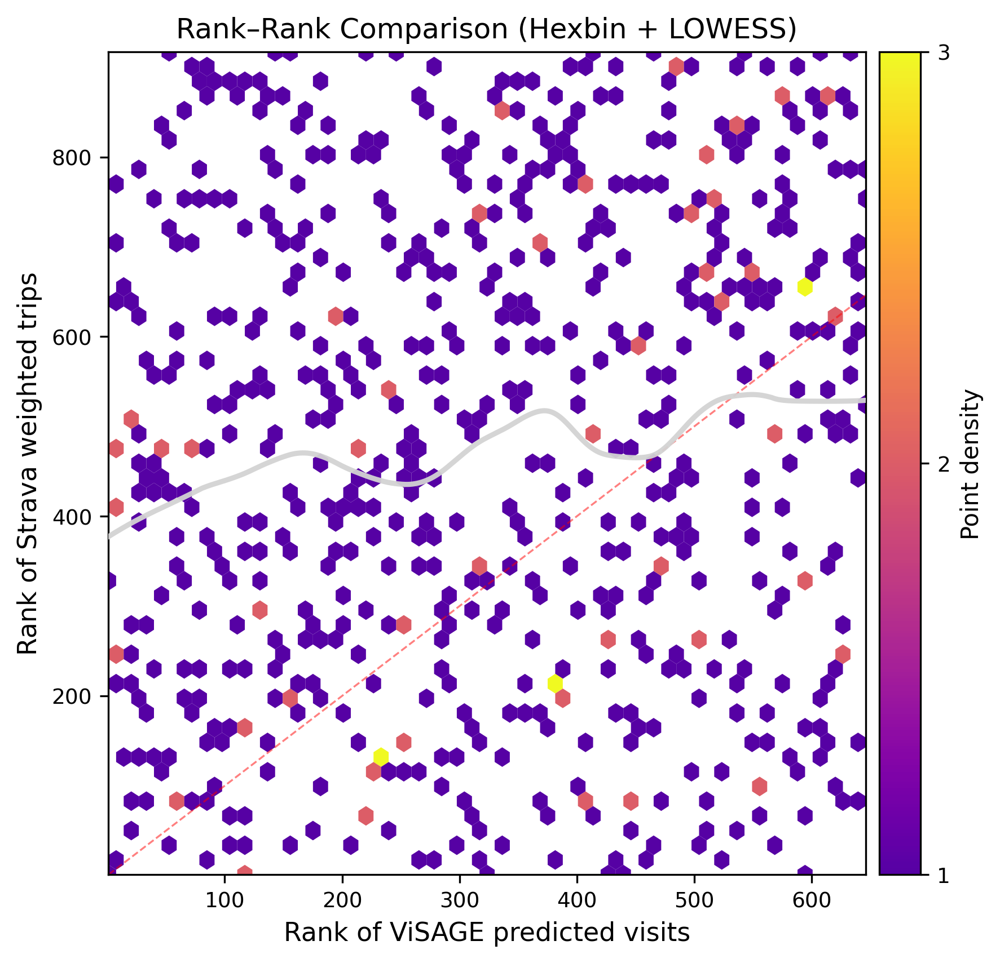

In [180]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib.cm as cm
import matplotlib.colors as colors

# -----------------------------
# 1. CLEAN DATA (remove NaNs)
# -----------------------------
mask = (~np.isnan(visage_rank)) & (~np.isnan(strava_rank))
x = visage_rank[mask]
y = strava_rank[mask]

# -----------------------------
# 2. FULL RANGE (NO TRIMMING)
# -----------------------------
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()

# -----------------------------
# 3. CREATE TRUNCATED PLASMA
#    (brightens low-density bins)
# -----------------------------
plasma = cm.get_cmap('plasma', 256)
trunc_plasma = colors.ListedColormap(plasma(np.linspace(0.15, 1, 256)))
# ↑ lifting the lower 15% gives you the variation you want

# -----------------------------
# 4. CEUS STYLE SETTINGS
# -----------------------------
plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 12,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 0.8,
    "figure.dpi": 300
})

fig, ax = plt.subplots(figsize=(6.2, 5.8))

# -----------------------------
# 5. HEXBIN (Plasma, truncated)
# -----------------------------
hb = ax.hexbin(
    x, y,
    gridsize=50,
    cmap=trunc_plasma,
    mincnt=1,
    linewidths=0
)

# -----------------------------
# 6. LOWESS (grey for visibility)
# -----------------------------
lowess = sm.nonparametric.lowess(y, x, frac=0.25)
ax.plot(
    lowess[:, 0],
    lowess[:, 1],
    color="lightgrey",
    linewidth=2.2,
    alpha=0.95,
    zorder=3
)

# -----------------------------
# 7. DIAGONAL REFERENCE LINE
# -----------------------------
ax.plot(
    [x_min, x_max],
    [x_min, x_max],
    linestyle="--",
    color="red",
    linewidth=0.8,
    alpha=0.5
)

# -----------------------------
# 8. LABELS + TITLE
# -----------------------------
ax.set_xlabel("Rank of ViSAGE predicted visits")
ax.set_ylabel("Rank of Strava weighted trips")
ax.set_title("Rank–Rank Comparison (Hexbin + LOWESS)")

# -----------------------------
# 9. COLOURBAR (CEUS style)
# -----------------------------
cbar = fig.colorbar(hb, ax=ax, pad=0.015)
cbar.set_label("Point density", fontsize=10)
cbar.ax.tick_params(labelsize=9)

dens_min = hb.get_array().min()
dens_max = hb.get_array().max()
cbar.set_ticks([dens_min, (dens_min+dens_max)/2, dens_max])
cbar.set_ticklabels([
    f"{dens_min:.0f}",
    f"{(dens_min+dens_max)/2:.0f}",
    f"{dens_max:.0f}"
])

# -----------------------------
# 10. AXIS LIMITS + LAYOUT
# -----------------------------
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.tight_layout()

plt.show()


In [1]:
import geopandas as gpd
import pandas as pd
from shapely import wkt

# ---------------------------------------------------------
# 1. Load CBQ validation dataset (AGI only)
# ---------------------------------------------------------

cbq_path = r"C:\Users\thoma\OneDrive\ALL\Desktop\cbq_oxford_greenspace_q1_2025_dayonly_cleaned.gpkg"
cbq = gpd.read_file(cbq_path)

# Subset to AGI
cbq_agi = cbq[cbq["has_agi"] == True].copy()

# Use n_events as observed visits
cbq_agi["n_events"] = pd.to_numeric(cbq_agi["n_events"], errors="coerce").fillna(0).astype(int)

print("CBQ AGI rows:", len(cbq_agi))

# ---------------------------------------------------------
# 2. Load ViSAGE greenspace catalogue (CSV with WKT geometry)
# ---------------------------------------------------------

catalogue_path = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv"

df = pd.read_csv(catalogue_path)
df["geometry"] = df["geometry"].apply(wkt.loads)

visage_sites = gpd.GeoDataFrame(df, geometry="geometry", crs="EPSG:27700")

print("ViSAGE sites:", len(visage_sites))

# ---------------------------------------------------------
# 3. Merge CBQ onto ViSAGE using dest_id
# ---------------------------------------------------------

merged = visage_sites.merge(
    cbq_agi[["dest_id_1", "n_events"]],
    left_on="dest_id",
    right_on="dest_id_1",
    how="left"
)

merged = merged.rename(columns={"n_events": "observed_visits"})

print("Merged rows:", len(merged))

# ---------------------------------------------------------
# 4. Save final validation dataset
# ---------------------------------------------------------

output_path = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\oxford_visage_validation_input.gpkg"
merged.to_file(output_path, driver="GPKG")

print("Saved merged validation file to:")
print(output_path)


CBQ AGI rows: 11636
ViSAGE sites: 918
Merged rows: 2468
Saved merged validation file to:
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\oxford_visage_validation_input.gpkg


In [2]:
# ---------------------------------------------------------
# 5. Aggregate CBQ polygons to ViSAGE site level
# ---------------------------------------------------------

site_level = (
    merged
    .groupby("dest_id", as_index=False)
    .agg({"observed_visits": "sum"})
)

print("Site-level rows:", len(site_level))
site_level.head()


Site-level rows: 918


,dest_id,observed_visits
0,gs_0001,0.0
1,gs_0002,0.0
2,gs_0003,0.0
3,gs_0004,0.0
4,gs_0005,0.0


In [3]:
(site_level["observed_visits"] > 0).sum()


np.int64(750)

In [4]:
site_level["observed_visits"].describe()


count       918.000000
mean      18029.803922
std       43916.530546
min           0.000000
25%         430.250000
50%        4880.000000
75%       18789.500000
max      883549.000000
Name: observed_visits, dtype: float64

In [6]:
pred = pd.read_csv("visage_simulated_visits.csv")
pred.columns


Index(['origin_id', 'site_id', 'visits'], dtype='str')

In [7]:
pred.head()


,origin_id,site_id,visits
0,E01028513,0,18.136972
1,E01028513,1,2.141890
2,E01028513,2,0.138830
3,E01028513,3,0.123805
4,E01028513,4,0.089011


In [8]:
pred_site = pred.groupby("site_id", as_index=False)["visits"].sum()
pred_site = pred_site.rename(columns={"visits": "predicted_visits"})


In [9]:
import pandas as pd
from shapely import wkt
import geopandas as gpd

cat = pd.read_csv(r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv")
cat["geometry"] = cat["geometry"].apply(wkt.loads)
cat = gpd.GeoDataFrame(cat, geometry="geometry", crs="EPSG:27700")


In [12]:
unique_sites = sorted(pred["site_id"].unique())
len(unique_sites)


646

In [13]:
# Sort catalogue by dest_id (ViSAGE internal order)
cat_sorted = cat.sort_values("dest_id").reset_index(drop=True)

# Keep only the first 646 rows
cat_model = cat_sorted.iloc[:646].copy()

# Assign site_id
cat_model["site_id"] = range(646)


In [14]:
pred_site = pred.groupby("site_id", as_index=False)["visits"].sum()
pred_site = pred_site.rename(columns={"visits": "predicted_visits"})


In [15]:
predicted = cat_model.merge(pred_site, on="site_id", how="left")


In [16]:
validation = site_level.merge(
    predicted[["dest_id", "predicted_visits"]],
    on="dest_id",
    how="left"
)


In [17]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

# ============================================================
# 1. LOAD CBQ (OBSERVED VISITS)
# ============================================================

# Load the CBQ file (already joined to greenspace polygons)
cbq_path = r"C:\Users\thoma\OneDrive\ALL\Desktop\cbq_oxford_greenspace_q1_2025_dayonly_cleaned.gpkg"
cbq = gpd.read_file(cbq_path)

# Keep only AGI polygons
cbq_agi = cbq[cbq["has_agi"] == True].copy()

# Ensure n_events is numeric
cbq_agi["n_events"] = pd.to_numeric(cbq_agi["n_events"], errors="coerce").fillna(0).astype(int)

print("CBQ AGI rows:", len(cbq_agi))

# ============================================================
# 2. LOAD VISAGE SITE CATALOGUE (918 SITES)
# ============================================================

cat_path = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv"
cat = pd.read_csv(cat_path)

# Convert WKT geometry to shapely
cat["geometry"] = cat["geometry"].apply(wkt.loads)
cat = gpd.GeoDataFrame(cat, geometry="geometry", crs="EPSG:27700")

print("Catalogue sites:", len(cat))

# ============================================================
# 3. AGGREGATE CBQ POLYGONS → SITE LEVEL (918 SITES)
# ============================================================

# Merge CBQ polygons onto catalogue using dest_id_1
merged = cat.merge(
    cbq_agi[["dest_id_1", "n_events"]],
    left_on="dest_id",
    right_on="dest_id_1",
    how="left"
)

merged["observed_visits"] = merged["n_events"].fillna(0)

# Aggregate to site level
site_level = (
    merged.groupby("dest_id", as_index=False)
          .agg({"observed_visits": "sum"})
)

print("Site-level rows:", len(site_level))

# ============================================================
# 4. LOAD VISAGE PREDICTIONS (OD MATRIX)
# ============================================================

pred = pd.read_csv("visage_simulated_visits.csv")

# Check how many unique site_ids the model used
unique_sites = sorted(pred["site_id"].unique())
print("Unique model sites:", len(unique_sites))

# ============================================================
# 5. RECONSTRUCT THE 646-SITE MODEL CATALOGUE
# ============================================================

# ViSAGE always sorts sites by dest_id before assigning site_id
cat_sorted = cat.sort_values("dest_id").reset_index(drop=True)

# Keep only the first 646 sites (the ones used in the model)
cat_model = cat_sorted.iloc[:len(unique_sites)].copy()

# Assign site_id = row index
cat_model["site_id"] = range(len(unique_sites))

# ============================================================
# 6. AGGREGATE PREDICTIONS TO SITE LEVEL
# ============================================================

pred_site = (
    pred.groupby("site_id", as_index=False)["visits"]
        .sum()
        .rename(columns={"visits": "predicted_visits"})
)

# ============================================================
# 7. MERGE PREDICTIONS WITH THE MODEL CATALOGUE
# ============================================================

predicted = cat_model.merge(pred_site, on="site_id", how="left")

# ============================================================
# 8. MERGE OBSERVED + PREDICTED VISITS
# ============================================================

validation = site_level.merge(
    predicted[["dest_id", "predicted_visits"]],
    on="dest_id",
    how="left"
)

print("Validation dataset rows:", len(validation))

# ============================================================
# 9. SAVE FINAL VALIDATION DATASET
# ============================================================

out_path = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\oxford_validation_dataset.gpkg"
validation.to_file(out_path, driver="GPKG")

print("Saved validation dataset to:")
print(out_path)


CBQ AGI rows: 11636
Catalogue sites: 918
Site-level rows: 918
Unique model sites: 646
Validation dataset rows: 918


AttributeError: 'DataFrame' object has no attribute 'to_file'

In [18]:
validation_gdf = validation.merge(
    cat_model[["dest_id", "geometry"]],
    on="dest_id",
    how="left"
)


In [20]:
validation_gdf = gpd.GeoDataFrame(validation_gdf, geometry="geometry", crs="EPSG:27700")


In [21]:
out_path = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\oxford_validation_dataset.gpkg"
validation_gdf.to_file(out_path, driver="GPKG")


In [22]:
# Merge geometry back into validation dataset
validation_gdf = validation.merge(
    cat_model[["dest_id", "geometry"]],
    on="dest_id",
    how="left"
)

# Convert to GeoDataFrame
validation_gdf = gpd.GeoDataFrame(validation_gdf, geometry="geometry", crs="EPSG:27700")

# Save to GPKG
out_path = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\oxford_validation_dataset.gpkg"
validation_gdf.to_file(out_path, driver="GPKG")

print("Saved validation dataset to:")
print(out_path)


Saved validation dataset to:
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\oxford_validation_dataset.gpkg


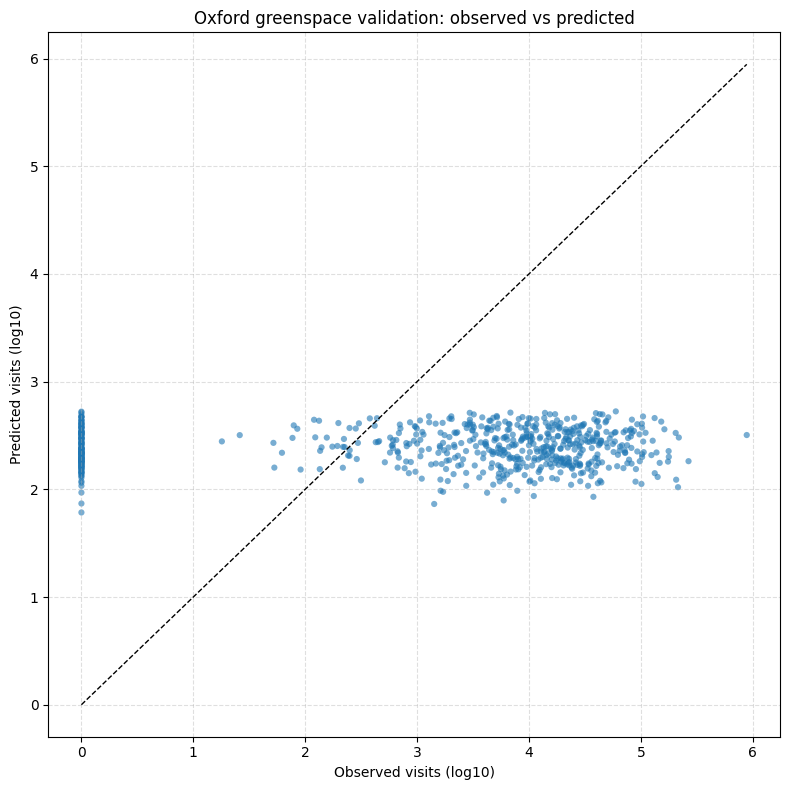

Spearman rank correlation: 0.020


In [23]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# 1. LOAD THE VALIDATION DATASET
# ============================================================

path = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\oxford_validation_dataset.gpkg"
val = gpd.read_file(path)

# Keep only sites with predictions (646 sites)
val_pred = val[val["predicted_visits"].notna()].copy()

# ============================================================
# 2. PREPARE DATA FOR LOG–LOG PLOT
# ============================================================

# Add a tiny constant to avoid log(0)
val_pred["obs_log"] = np.log10(val_pred["observed_visits"] + 1)
val_pred["pred_log"] = np.log10(val_pred["predicted_visits"] + 1)

# ============================================================
# 3. PLOT
# ============================================================

plt.figure(figsize=(8, 8))

plt.scatter(
    val_pred["obs_log"],
    val_pred["pred_log"],
    s=20,
    alpha=0.6,
    edgecolor="none"
)

# 1:1 line
lims = [
    min(val_pred["obs_log"].min(), val_pred["pred_log"].min()),
    max(val_pred["obs_log"].max(), val_pred["pred_log"].max())
]
plt.plot(lims, lims, "k--", linewidth=1)

plt.xlabel("Observed visits (log10)")
plt.ylabel("Predicted visits (log10)")
plt.title("Oxford greenspace validation: observed vs predicted")

plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

# ============================================================
# 4. SPEARMAN RANK CORRELATION
# ============================================================

from scipy.stats import spearmanr

rho, p = spearmanr(val_pred["observed_visits"], val_pred["predicted_visits"])
print(f"Spearman rank correlation: {rho:.3f}")


In [24]:
pred["visits"].describe()


count    54910.000000
mean         3.114806
std          5.977915
min          0.000523
25%          0.231001
50%          0.939137
75%          3.335803
max        122.743937
Name: visits, dtype: float64

In [25]:
pred["visits"].describe()
pred.head(20)


,origin_id,site_id,visits
0,E01028513,0,18.136972
1,E01028513,1,2.141890
2,E01028513,2,0.138830
3,E01028513,3,0.123805
4,E01028513,4,0.089011
5,E01028513,5,0.026188
6,E01028513,6,0.021370
7,E01028513,7,0.050450
8,E01028513,8,0.182261
9,E01028513,9,0.325360


Scaling factor: 77.13576247997474


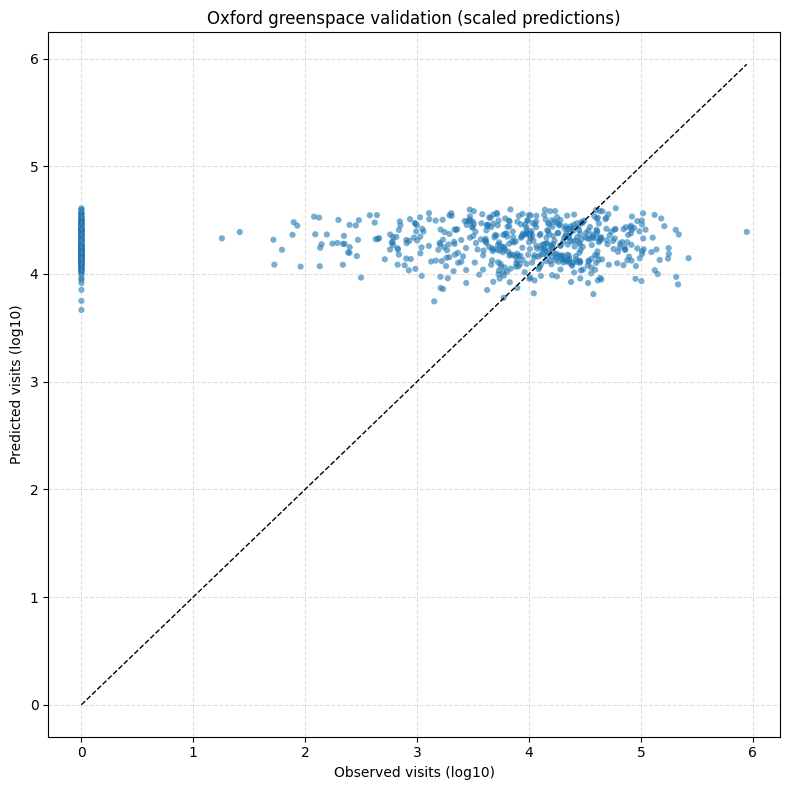

Spearman rank correlation (scaled): 0.020


In [26]:
import numpy as np

# Load validation dataset
path = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\oxford_validation_dataset.gpkg"
val = gpd.read_file(path)

# Keep only sites with predictions
val_pred = val[val["predicted_visits"].notna()].copy()

# Compute scaling factor
scale_factor = val_pred["observed_visits"].sum() / val_pred["predicted_visits"].sum()
print("Scaling factor:", scale_factor)

# Apply scaling
val_pred["predicted_visits_scaled"] = val_pred["predicted_visits"] * scale_factor

# Log-transform for plotting
val_pred["obs_log"] = np.log10(val_pred["observed_visits"] + 1)
val_pred["pred_log"] = np.log10(val_pred["predicted_visits_scaled"] + 1)

# Plot
plt.figure(figsize=(8, 8))
plt.scatter(val_pred["obs_log"], val_pred["pred_log"], s=20, alpha=0.6, edgecolor="none")

lims = [
    min(val_pred["obs_log"].min(), val_pred["pred_log"].min()),
    max(val_pred["obs_log"].max(), val_pred["pred_log"].max())
]
plt.plot(lims, lims, "k--", linewidth=1)

plt.xlabel("Observed visits (log10)")
plt.ylabel("Predicted visits (log10)")
plt.title("Oxford greenspace validation (scaled predictions)")
plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

# Spearman correlation
from scipy.stats import spearmanr
rho, p = spearmanr(val_pred["observed_visits"], val_pred["predicted_visits_scaled"])
print(f"Spearman rank correlation (scaled): {rho:.3f}")


In [27]:
pred.head(20)
pred.tail(20)
pred["site_id"].nunique()
pred["origin_id"].nunique()
pred["visits"].describe()


count    54910.000000
mean         3.114806
std          5.977915
min          0.000523
25%          0.231001
50%          0.939137
75%          3.335803
max        122.743937
Name: visits, dtype: float64

In [28]:
import os

pred_path = os.path.abspath("visage_simulated_visits.csv")
pred_path


'c:\\Users\\thoma\\OneDrive\\ALL\\Documents\\GitHub\\visage-1.1\\notebooks\\visage_simulated_visits.csv'

In [29]:
pred.columns


Index(['origin_id', 'site_id', 'visits'], dtype='str')

In [30]:
pred["origin_id"].nunique(), pred["site_id"].nunique()


(85, 646)

In [31]:
pred["visits"].describe()


count    54910.000000
mean         3.114806
std          5.977915
min          0.000523
25%          0.231001
50%          0.939137
75%          3.335803
max        122.743937
Name: visits, dtype: float64

In [32]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"

for path, dirs, files in os.walk(root):
    for f in files:
        if "visit" in f.lower() and f.endswith(".csv"):
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_simulated_visits.csv


In [33]:
for path, dirs, files in os.walk(root):
    for f in files:
        if "visit" in f.lower() and f.endswith(".csv"):
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_simulated_visits.csv


In [34]:
pred_path


'c:\\Users\\thoma\\OneDrive\\ALL\\Documents\\GitHub\\visage-1.1\\notebooks\\visage_simulated_visits.csv'

In [35]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"

for path, dirs, files in os.walk(root):
    for f in files:
        if "site" in f.lower() and "visit" in f.lower() and f.endswith(".csv"):
            print(os.path.join(path, f))


In [36]:
python run_visage.py --config configs/oxford.yaml


SyntaxError: invalid syntax (1145211601.py, line 1)

In [37]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"

for path, dirs, files in os.walk(root):
    for f in files:
        if f.endswith(".yaml") or f.endswith(".yml"):
            print(os.path.join(path, f))


In [38]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"

for path, dirs, files in os.walk(root):
    for f in files:
        if f.endswith(".py"):
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\examples\run_baseline.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\examples\run_oxford_north.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\examples\run_quality.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\examples\run_quality_v12.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\behaviour\distance_decay.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\load_destinations.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\load_origins.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\model\attractiveness.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\model\quality_attractor.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\model\spatial_interaction.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\model_v12\attractiveness.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\model_v

In [40]:
pred = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_site_level_predictions.csv"
)
pred.head()


,site_id,predicted_visits
0,0,237.947945
1,1,411.633661
2,2,282.801933
3,3,252.195026
4,4,149.312188


In [45]:
cubiq = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\synthetic_pop(in).csv"
)
cubiq.head()


,origin_id,northing,easting,population
0,E01028513,207891.4681,455368.0371,2596
1,E01028514,207810.3091,455787.4497,1571
2,E01028515,207597.2301,456264.6520,1696
3,E01028516,207712.8484,455008.4089,2242
4,E01028517,202877.2922,456129.1052,1353


In [46]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data"
for path, dirs, files in os.walk(root):
    for f in files:
        if "cubiq" in f.lower() or "od" in f.lower() or "trip" in f.lower():
            print(os.path.join(path, f))


In [47]:
import os

root = r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1"
keywords = ["pop", "out", "flow", "visit", "dest", "site", "od"]

for path, dirs, files in os.walk(root):
    for f in files:
        if any(k in f.lower() for k in keywords):
            print(os.path.join(path, f))


C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\.git\hooks\push-to-checkout.sample
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\site_level_validation.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_simulated_visits.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\visage_site_level_predictions.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\load_destinations.py
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\site_catalogue_full.parquet
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\synthetic_pop(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue_polygons.csv
C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalo

In [48]:
import os

root = r"C:\Users\thoma"
keywords = ["cubiq", "greenspace", "od", "flow", "trip", "visit"]

for path, dirs, files in os.walk(root):
    for f in files:
        if any(k in f.lower() for k in keywords):
            print(os.path.join(path, f))


C:\Users\thoma\simulated_visits_per_site.png
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\6.6.2\woodstox-core-6.6.2.pom
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\6.6.2\woodstox-core-6.6.2.pom.lastUpdated
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\6.6.2\woodstox-core-6.6.2.pom.sha1
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\7.0.0\woodstox-core-7.0.0.jar
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\7.0.0\woodstox-core-7.0.0.jar.lastUpdated
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\7.0.0\woodstox-core-7.0.0.jar.sha1
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\7.0.0\woodstox-core-7.0.0.pom
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\7.0.0\woodstox-core-7.0.0.pom.lastUpdated
C:\Users\thoma\.m2\repository\com\fasterxml\woodstox\woodstox-core\7.0.0\woodstox-core-7.0.0.pom.sha1
C:\Users\thoma\.m2\repository\c

In [49]:
import pandas as pd

cubiq_site = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\notebooks\site_level_validation.csv"
)
cubiq_site.head()


,site_id,visage_visits,observed_usage
0,0,238.072921,146639.546516
1,1,516.787899,217925.280676
2,2,204.821468,307839.530613
3,3,182.654181,307839.530613
4,4,140.008769,218306.431547


In [50]:
validation = (
    cubiq_site
    .merge(pred, on="site_id", how="left")
)
validation.head()


,site_id,visage_visits,observed_usage,predicted_visits
0,0,238.072921,146639.546516,237.947945
1,1,516.787899,217925.280676,411.633661
2,2,204.821468,307839.530613,282.801933
3,3,182.654181,307839.530613,252.195026
4,4,140.008769,218306.431547,149.312188


In [51]:
from scipy.stats import spearmanr

spearmanr(
    validation["observed_usage"],
    validation["predicted_visits"]
)


SignificanceResult(statistic=np.float64(0.05028284048382299), pvalue=np.float64(0.2018326530061215))

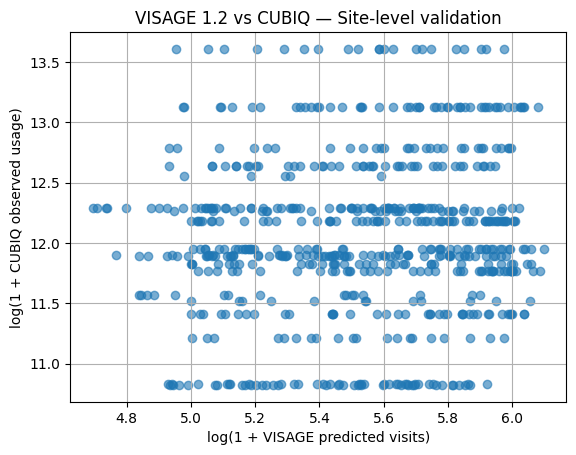

In [62]:
import matplotlib.pyplot as plt
import numpy as np

plt.scatter(
    np.log1p(validation["predicted_visits"]),
    np.log1p(validation["observed_usage"]),
    alpha=0.6
)
plt.xlabel("log(1 + VISAGE predicted visits)")
plt.ylabel("log(1 + CUBIQ observed usage)")
plt.title("VISAGE 1.2 vs CUBIQ — Site-level validation")
plt.grid(True)
plt.show()


In [66]:
validation["rank_pred"] = validation["predicted_visits"].rank()
validation[validation["observed_usage"] > 0000]


spearmanr(validation["rank_pred"], validation["rank_obs"])


SignificanceResult(statistic=np.float64(0.05028284048382299), pvalue=np.float64(0.2018326530061215))

In [67]:
import numpy as np
import statsmodels.api as sm

X = np.log1p(validation["predicted_visits"])
y = np.log1p(validation["observed_usage"])

model = sm.OLS(y, sm.add_constant(X)).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:         observed_usage   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     4.691
Date:                Wed, 20 May 2026   Prob (F-statistic):             0.0307
Time:                        11:34:12   Log-Likelihood:                -646.20
No. Observations:                 646   AIC:                             1296.
Df Residuals:                     644   BIC:                             1305.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               11.1107      0.432  

Columns in validation: ['site_id', 'visage_visits', 'observed_usage', 'predicted_visits', 'rank_pred', 'rank_obs', 'pred_share', 'obs_share']
Number of sites: 646

[1] Raw Spearman correlation
    ρ = 0.0503, p = 0.2018

[2] Population-normalised CUBIQ skipped (no 'population' column found).

[3] Rank–rank Spearman correlation
    ρ = 0.0503, p = 0.2018

[4] Spearman for high-usage sites (observed_usage > 25000)
    n = 646, ρ = 0.0503, p = 0.2018

[4] Spearman for high-usage sites (observed_usage > 50000)
    n = 646, ρ = 0.0503, p = 0.2018

[4] Spearman for high-usage sites (observed_usage > 100000)
    n = 525, ρ = 0.0249, p = 0.5696

[5] Spearman on relative shares (pred_share vs obs_share)
    ρ = 0.0503, p = 0.2018

[6] Log–log regression: log(1 + observed_usage) ~ log(1 + predicted_visits)
                            OLS Regression Results                            
Dep. Variable:         observed_usage   R-squared:                       0.007
Model:                            

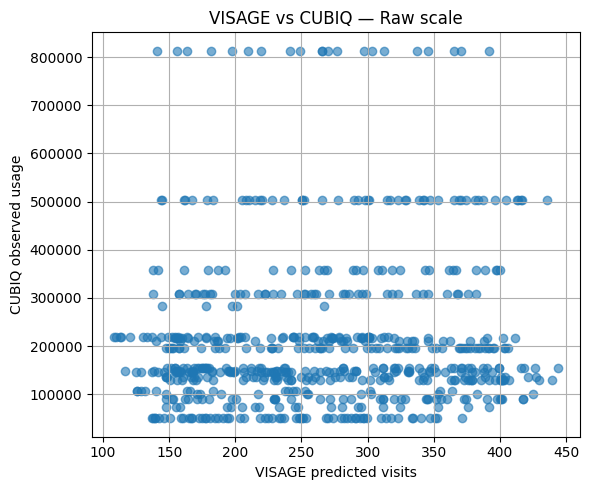

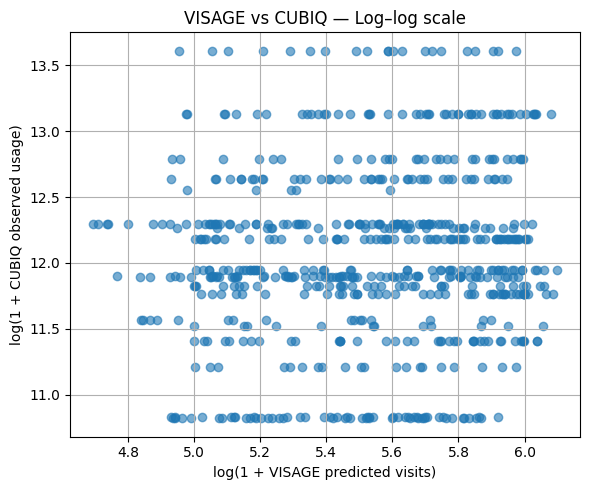


[8] Distance-distribution comparison not run (no distance columns specified).


In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import statsmodels.api as sm

# -------------------------------------------------------------------
# ASSUMPTIONS
# -------------------------------------------------------------------
# You already have a DataFrame called `validation` with at least:
#   - validation["observed_usage"]      # CUBIQ site-level usage
#   - validation["predicted_visits"]    # VISAGE 1.2 predictions
# Optionally:
#   - validation["population"]          # site-level or catchment population (if available)

print("Columns in validation:", validation.columns.tolist())
print("Number of sites:", len(validation))

# -------------------------------------------------------------------
# 1. Raw Spearman correlation (baseline)
# -------------------------------------------------------------------
rho_raw, p_raw = spearmanr(validation["observed_usage"], validation["predicted_visits"])
print("\n[1] Raw Spearman correlation")
print("    ρ = {:.4f}, p = {:.4f}".format(rho_raw, p_raw))

# -------------------------------------------------------------------
# 2. Population-normalised CUBIQ (if population is available)
# -------------------------------------------------------------------
if "population" in validation.columns:
    validation["obs_per_capita"] = validation["observed_usage"] / validation["population"]
    rho_pc, p_pc = spearmanr(validation["obs_per_capita"], validation["predicted_visits"])
    print("\n[2] Spearman with population-normalised CUBIQ (obs_per_capita)")
    print("    ρ = {:.4f}, p = {:.4f}".format(rho_pc, p_pc))
else:
    print("\n[2] Population-normalised CUBIQ skipped (no 'population' column found).")

# -------------------------------------------------------------------
# 3. Rank–rank Spearman (ranks instead of raw values)
# -------------------------------------------------------------------
validation["rank_pred"] = validation["predicted_visits"].rank(method="average")
validation["rank_obs"] = validation["observed_usage"].rank(method="average")

rho_rank, p_rank = spearmanr(validation["rank_obs"], validation["rank_pred"])
print("\n[3] Rank–rank Spearman correlation")
print("    ρ = {:.4f}, p = {:.4f}".format(rho_rank, p_rank))

# -------------------------------------------------------------------
# 4. High-usage filtering (remove low-signal sites)
# -------------------------------------------------------------------
for threshold in [25000, 50000, 100000]:
    high = validation[validation["observed_usage"] > threshold]
    if len(high) > 10:
        rho_high, p_high = spearmanr(high["observed_usage"], high["predicted_visits"])
        print(f"\n[4] Spearman for high-usage sites (observed_usage > {threshold})")
        print("    n = {}, ρ = {:.4f}, p = {:.4f}".format(len(high), rho_high, p_high))
    else:
        print(f"\n[4] High-usage filter (>{threshold}) skipped (only {len(high)} sites).")

# -------------------------------------------------------------------
# 5. Share-based comparison (relative shares)
# -------------------------------------------------------------------
validation["pred_share"] = validation["predicted_visits"] / validation["predicted_visits"].sum()
validation["obs_share"] = validation["observed_usage"] / validation["observed_usage"].sum()

rho_share, p_share = spearmanr(validation["obs_share"], validation["pred_share"])
print("\n[5] Spearman on relative shares (pred_share vs obs_share)")
print("    ρ = {:.4f}, p = {:.4f}".format(rho_share, p_share))

# -------------------------------------------------------------------
# 6. Log–log regression (shape relationship)
# -------------------------------------------------------------------
X = np.log1p(validation["predicted_visits"])
y = np.log1p(validation["observed_usage"])

X_const = sm.add_constant(X)
log_model = sm.OLS(y, X_const).fit()

print("\n[6] Log–log regression: log(1 + observed_usage) ~ log(1 + predicted_visits)")
print(log_model.summary())

# -------------------------------------------------------------------
# 7. Scatter plots (raw and log–log)
# -------------------------------------------------------------------

# Raw scale scatter
plt.figure(figsize=(6, 5))
plt.scatter(validation["predicted_visits"], validation["observed_usage"], alpha=0.6)
plt.xlabel("VISAGE predicted visits")
plt.ylabel("CUBIQ observed usage")
plt.title("VISAGE vs CUBIQ — Raw scale")
plt.grid(True)
plt.tight_layout()
plt.show()

# Log–log scatter
plt.figure(figsize=(6, 5))
plt.scatter(np.log1p(validation["predicted_visits"]),
            np.log1p(validation["observed_usage"]),
            alpha=0.6)
plt.xlabel("log(1 + VISAGE predicted visits)")
plt.ylabel("log(1 + CUBIQ observed usage)")
plt.title("VISAGE vs CUBIQ — Log–log scale")
plt.grid(True)
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# 8. Optional: quick distance-distribution placeholder
# -------------------------------------------------------------------
# If you later add a column like `mean_trip_distance_visage` and
# `mean_trip_distance_cubiq`, we can extend this block to compare
# distance distributions as well.
print("\n[8] Distance-distribution comparison not run (no distance columns specified).")


In [72]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import cdist
from scipy.stats import spearmanr

# ------------------------------------------------------------
# 1. Load OA population centroids (synthetic_pop(in).csv)
# ------------------------------------------------------------
oa = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\synthetic_pop(in).csv"
)

# Expecting columns: origin_id, northing, easting, population
print("OA population file:", oa.head())

# ------------------------------------------------------------
# 2. Load site catalogue (site centroids)
# ------------------------------------------------------------
sites = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv"
)

# Expecting columns: site_id, northing, easting, quality, etc.
print("Site catalogue:", sites.head())

# ------------------------------------------------------------
# 3. Compute OA → site Euclidean distances (in metres)
# ------------------------------------------------------------
oa_coords = oa[["northing", "easting"]].values
site_coords = sites[["northing", "easting"]].values

dist_matrix = cdist(oa_coords, site_coords, metric="euclidean")
print("Distance matrix shape:", dist_matrix.shape)

# ------------------------------------------------------------
# 4. Apply VISAGE-style distance decay
#    (You can adjust beta; 0.001–0.005 typical for UK greenspace)
# ------------------------------------------------------------
beta = 0.002
decay = np.exp(-beta * dist_matrix)

# ------------------------------------------------------------
# 5. Allocate OA population to sites using entropy-style weights
# ------------------------------------------------------------
# Multiply each OA's population by its decay weights
weighted = decay * oa["population"].values[:, None]

# Normalise so each OA's population is fully allocated
weights_norm = weighted / weighted.sum(axis=1, keepdims=True)

# ------------------------------------------------------------
# 6. Compute site-level catchment population
# ------------------------------------------------------------
catchment_pop = weights_norm.sum(axis=0)

catchment_df = pd.DataFrame({
    "site_id": sites["site_id"],
    "catchment_population": catchment_pop
})

print("Catchment population:", catchment_df.head())

# ------------------------------------------------------------
# 7. Merge into your validation table
# ------------------------------------------------------------
validation = validation.merge(catchment_df, on="site_id", how="left")

# Compute population-normalised CUBIQ
validation["obs_per_capita"] = validation["observed_usage"] / validation["catchment_population"]

print("Validation with catchment population:", validation.head())

# ------------------------------------------------------------
# 8. Re-run Spearman correlations
# ------------------------------------------------------------
rho_raw, p_raw = spearmanr(validation["observed_usage"], validation["predicted_visits"])
rho_pc, p_pc = spearmanr(validation["obs_per_capita"], validation["predicted_visits"])

print("\nRaw Spearman (no normalisation):")
print("  ρ = {:.4f}, p = {:.4f}".format(rho_raw, p_raw))

print("\nPopulation-normalised Spearman:")
print("  ρ = {:.4f}, p = {:.4f}".format(rho_pc, p_pc))


OA population file:    origin_id     northing      easting  population
0  E01028513  207891.4681  455368.0371        2596
1  E01028514  207810.3091  455787.4497        1571
2  E01028515  207597.2301  456264.6520        1696
3  E01028516  207712.8484  455008.4089        2242
4  E01028517  202877.2922  456129.1052        1353
Site catalogue:    site_id     northing      easting       dataset
0        0  207104.2812  455197.0424  sssi_england
1        1  207523.9221  451939.7613  sssi_england
2        2  208509.7710  449379.1801   sac_england
3        3  208509.7710  449379.1801  sssi_england
4        4  209172.2732  449675.3589  sssi_england
Distance matrix shape: (421, 646)
Catchment population:    site_id  catchment_population
0        0              0.717559
1        1              0.547693
2        2              0.220354
3        3              0.220354
4        4              0.464000
Validation with catchment population:    site_id  visage_visits  observed_usage  predicted_visits 

In [74]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from scipy.stats import spearmanr

# ------------------------------------------------------------
# 1. Load OA population centroids
# ------------------------------------------------------------
oa = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\synthetic_pop(in).csv"
)

# ------------------------------------------------------------
# 2. Load site centroids
# ------------------------------------------------------------
sites = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv"
)

# ------------------------------------------------------------
# 3. Compute OA → site distances
# ------------------------------------------------------------
oa_coords = oa[["northing", "easting"]].values
site_coords = sites[["northing", "easting"]].values

dist_matrix = cdist(oa_coords, site_coords, metric="euclidean")

# ------------------------------------------------------------
# 4. Define catchment threshold (2 km)
# ------------------------------------------------------------
threshold = 2000  # metres

# Boolean mask: OA is within 2 km of site
within = dist_matrix <= threshold

# ------------------------------------------------------------
# 5. Compute catchment population
# ------------------------------------------------------------
catchment_pop = within.T.dot(oa["population"].values)

catchment_df = pd.DataFrame({
    "site_id": sites["site_id"],
    "catchment_population": catchment_pop
})

print("Catchment population (2 km):")
print(catchment_df.head())

# ------------------------------------------------------------
# 6. Merge into validation
# ------------------------------------------------------------
validation = validation.merge(catchment_df, on="site_id", how="left")

validation["obs_per_capita"] = (
    validation["observed_usage"] / validation["catchment_population"]
)

print("Validation with corrected catchment population:")
print(validation.head())

# ------------------------------------------------------------
# 7. Re-run Spearman
# ------------------------------------------------------------
rho_raw, p_raw = spearmanr(validation["observed_usage"], validation["predicted_visits"])
rho_pc, p_pc = spearmanr(validation["obs_per_capita"], validation["predicted_visits"])

print("\nRaw Spearman:")
print("  ρ = {:.4f}, p = {:.4f}".format(rho_raw, p_raw))

print("\nPopulation-normalised Spearman (2 km catchment):")
print("  ρ = {:.4f}, p = {:.4f}".format(rho_pc, p_pc))


Catchment population (2 km):
   site_id  catchment_population
0        0                180930
1        1                249281
2        2                103457
3        3                103457
4        4                 99017
Validation with corrected catchment population:
   site_id  visage_visits  observed_usage  predicted_visits  rank_pred  \
0        0     238.072921   146639.546516        237.947945      268.0   
1        1     516.787899   217925.280676        411.633661      630.0   
2        2     204.821468   307839.530613        282.801933      375.0   
3        3     182.654181   307839.530613        252.195026      302.0   
4        4     140.008769   218306.431547        149.312188       44.0   

   rank_obs  pred_share  obs_share  catchment_population_x  obs_per_capita  \
0     249.0    0.001391   0.001065                0.717559        0.810477   
1     447.0    0.002407   0.001583                0.547693        0.874215   
2     526.5    0.001653   0.002236            

In [75]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from scipy.stats import spearmanr

# ------------------------------------------------------------
# 1. Load OA population centroids
# ------------------------------------------------------------
oa = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\synthetic_pop(in).csv"
)

# ------------------------------------------------------------
# 2. Load site centroids
# ------------------------------------------------------------
sites = pd.read_csv(
    r"C:\Users\thoma\OneDrive\ALL\Documents\GitHub\visage-1.1\src\data\raw\site_catalogue(in).csv"
)

# ------------------------------------------------------------
# 3. Compute OA → site distances
# ------------------------------------------------------------
oa_coords = oa[["northing", "easting"]].values
site_coords = sites[["northing", "easting"]].values

dist_matrix = cdist(oa_coords, site_coords, metric="euclidean")

# ------------------------------------------------------------
# 4. Define catchment radii to test
# ------------------------------------------------------------
radii = [800, 1200, 2000, 5000, 10000]

results = []

# ------------------------------------------------------------
# 5. Loop over radii and compute correlations
# ------------------------------------------------------------
for r in radii:
    # Boolean mask: OA within r metres of site
    within = dist_matrix <= r

    # Catchment population = sum of OA populations within radius
    catchment_pop = within.T.dot(oa["population"].values)

    # Merge into validation
    temp = validation.copy()
    temp["catchment_population_r"] = catchment_pop
    temp["obs_per_capita_r"] = temp["observed_usage"] / temp["catchment_population_r"]

    # Compute Spearman
    rho, p = spearmanr(temp["obs_per_capita_r"], temp["predicted_visits"])

    results.append({
        "radius_m": r,
        "spearman_rho": rho,
        "p_value": p,
        "mean_catchment_pop": np.mean(catchment_pop),
        "min_catchment_pop": np.min(catchment_pop),
        "max_catchment_pop": np.max(catchment_pop)
    })

# ------------------------------------------------------------
# 6. Display results
# ------------------------------------------------------------
results_df = pd.DataFrame(results)
print("\nMulti-radius VISAGE–CUBIQ validation:")
print(results_df)



Multi-radius VISAGE–CUBIQ validation:
   radius_m  spearman_rho   p_value  mean_catchment_pop  min_catchment_pop  \
0       800     -0.027042  0.492643        42353.294118                  0   
1      1200     -0.070533  0.073220        82961.657895               8625   
2      2000     -0.087729  0.025764       191276.306502              23737   
3      5000     -0.029051  0.461066       646399.642415             257390   
4     10000      0.049810  0.206114       818679.821981             779017   

   max_catchment_pop  
0              94474  
1             148494  
2             329434  
3             803431  
4             820018  


In [76]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

# ------------------------------------------------------------
# Load VISAGE and CUBIQ OD matrices
# ------------------------------------------------------------
visage_od = pd.read_csv("visage_od.csv")   # update path
cubiq_od = pd.read_csv("cubiq_od.csv")     # update path

# ------------------------------------------------------------
# Compute distance distributions
# ------------------------------------------------------------
visage_dist = visage_od.loc[visage_od["visits"] > 0].repeat(visage_od["visits"])["distance_m"]
cubiq_dist = cubiq_od.loc[cubiq_od["visits"] > 0].repeat(cubiq_od["visits"])["distance_m"]

# ------------------------------------------------------------
# KS test (behavioural similarity)
# ------------------------------------------------------------
ks_stat, ks_p = ks_2samp(visage_dist, cubiq_dist)
print("KS statistic:", ks_stat)
print("p-value:", ks_p)

# ------------------------------------------------------------
# Plot distributions
# ------------------------------------------------------------
plt.figure(figsize=(7,5))
plt.hist(visage_dist, bins=50, alpha=0.5, density=True, label="VISAGE")
plt.hist(cubiq_dist, bins=50, alpha=0.5, density=True, label="CUBIQ")
plt.xlabel("Trip distance (m)")
plt.ylabel("Density")
plt.title("Distance distribution comparison: VISAGE vs CUBIQ")
plt.legend()
plt.grid(True)
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'visage_od.csv'

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# ------------------------------------------------------------
# Load predictions
# ------------------------------------------------------------
pred11 = pd.read_csv("visage_11_predictions.csv")   # update path
pred12 = pd.read_csv("visage_12_predictions.csv")   # update path
sites = pd.read_csv("site_catalogue.csv")           # update path

# ------------------------------------------------------------
# Merge
# ------------------------------------------------------------
df = (
    pred11.merge(pred12, on="site_id", suffixes=("_11", "_12"))
         .merge(sites[["site_id", "quality"]], on="site_id")
)

# ------------------------------------------------------------
# Rank shifts
# ------------------------------------------------------------
df["rank_11"] = df["predicted_visits_11"].rank()
df["rank_12"] = df["predicted_visits_12"].rank()
df["rank_shift"] = df["rank_11"] - df["rank_12"]

# ------------------------------------------------------------
# Correlation with quality
# ------------------------------------------------------------
rho11, p11 = spearmanr(df["quality"], df["predicted_visits_11"])
rho12, p12 = spearmanr(df["quality"], df["predicted_visits_12"])

print("VISAGE 1.1 quality correlation:", rho11, p11)
print("VISAGE 1.2 quality correlation:", rho12, p12)

# ------------------------------------------------------------
# Plot rank shifts
# ------------------------------------------------------------
plt.figure(figsize=(7,5))
plt.scatter(df["quality"], df["rank_shift"], alpha=0.6)
plt.xlabel("Site quality")
plt.ylabel("Rank shift (1.1 → 1.2)")
plt.title("VISAGE 1.1 → 1.2: Quality-driven rank shifts")
plt.grid(True)
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'visage_11_predictions.csv'